In [1]:
%load_ext autoreload
%autoreload 2
#%matplotlib inline
from PhysicsDatasets import SHODatasetXV, DampedSHODatasetXV, DampedSHODatasetV2
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import json
from matplotlib.colors import LogNorm, Normalize
from utils import load_model
import utils
import os
from datetime import datetime
import yaml
import re
from tqdm import tqdm
import plotting as ptools
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Undamped Trainings

## Generalization in mass: extrapolation and interpolation

### Low --> High mass extrapolation. Trained with full range of $k$

In [4]:
model = "discrete_mkb_mLo_kAll_beta0_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [6,7,8,9,10]
id_vals = [1,2,3,4,5]
kcut = slice(2,-2)

In [136]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_mass_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [1,5]

        for i,k_test in enumerate(ks):
            plt.figure(figsize=(8,6))
            ik = list(ks).index(k_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(masses,data[n_iter][n_ctx_test-1,:,ik,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $k = {k_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Mass",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/k{k_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

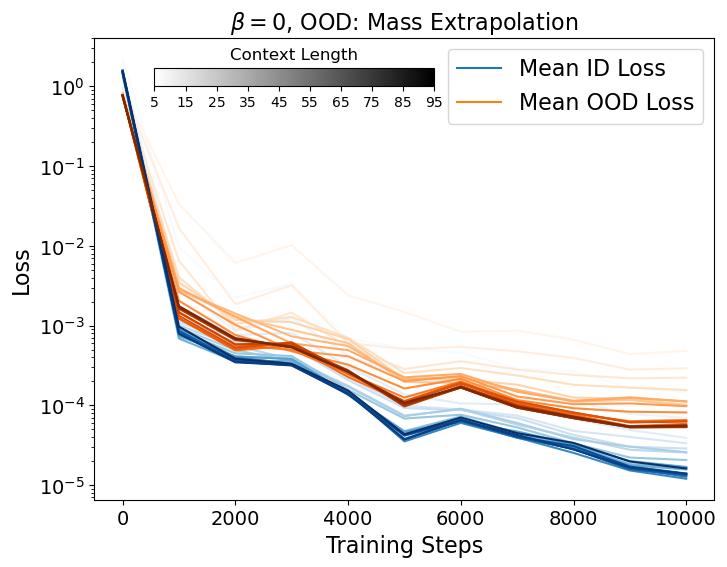

In [6]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

context_lens = np.arange(5,99,5)
cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

fig = plt.figure(figsize=(8,6))
for ic,n_ctx in enumerate(context_lens):
    ictx = n_ctx-1
    mean_ood_performance = []
    mean_id_performance = []
    for n_iter in n_iters:
        dsel = data[n_iter]
        total_loss = 0
        total_n = 0
        for ood in ood_vals:
            im = list(masses).index(ood)
            total_loss += dsel[ictx,im,kcut,ib].sum()
            total_n += dsel[ictx,im,kcut,ib].size
        mean_ood_performance.append(total_loss/total_n)

        total_loss = 0
        total_n = 0
        for id_val in id_vals:
            im = list(masses).index(id_val)
            total_loss += dsel[ictx,im,kcut,ib].sum()
            total_n += dsel[ictx,im,kcut,ib].size
        mean_id_performance.append(total_loss/total_n)

    plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
    plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])
    
#plt.legend(loc='upper right',fontsize=16)
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
plt.yscale('log')

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=context_lens[::2])
cbar_ax.tick_params(labelsize=10)

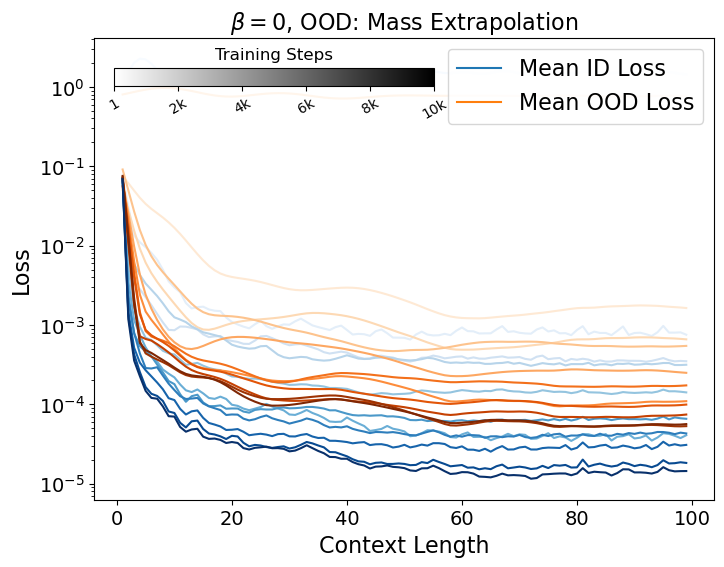

In [7]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

fig = plt.figure(figsize=(8,6))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    
    all_losses = []
    for ood in ood_vals:
        im = list(masses).index(ood)
        all_losses.append(dsel[:,im,kcut,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])
    
    all_losses = []
    for id_val in id_vals:
        im = list(masses).index(id_val)
        all_losses.append(dsel[:,im,kcut,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])
    
    
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Context Length",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
plt.yscale('log')

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
cbar_ax.tick_params(labelsize=10,rotation=30)

Text(0.5, 1.0, '$\\beta = 0$, OOD Performance')

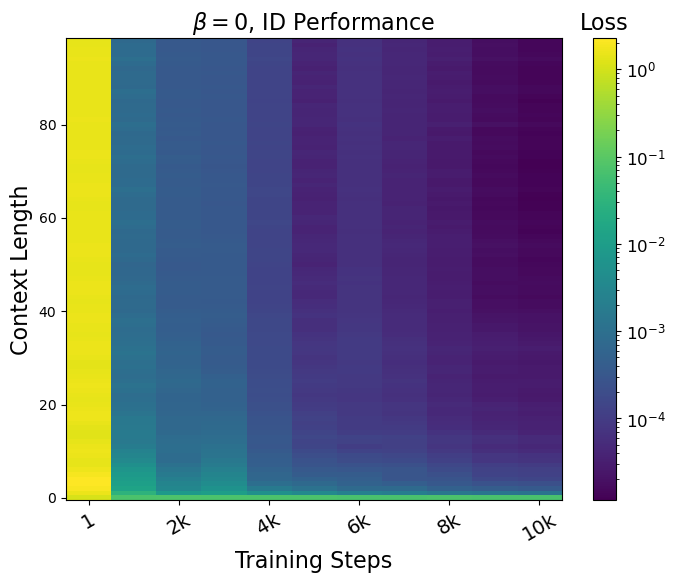

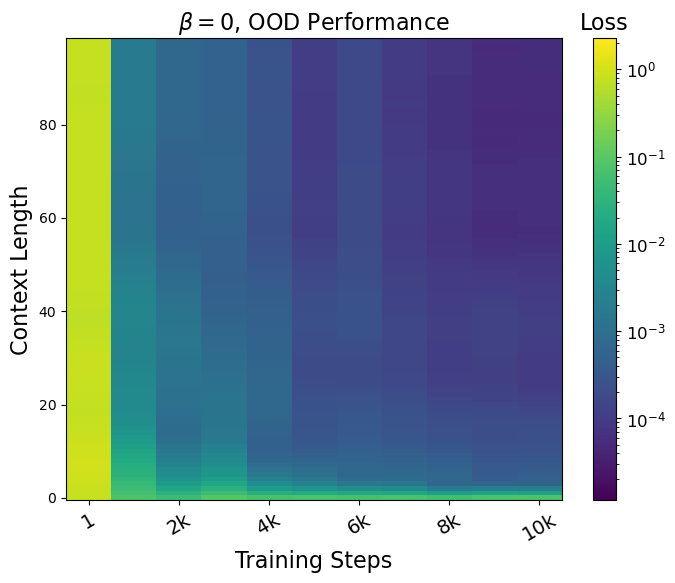

In [8]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

map_ood = np.zeros((len(n_iters),99))
map_id = np.zeros((len(n_iters),99))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    for ictx in np.arange(99):
        loss = []
        for ood in ood_vals:
            im = list(masses).index(ood)
            loss.append(dsel[ictx,im,kcut,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_ood[ii,ictx] = loss
        
        loss = []
        for id_val in id_vals:
            im = list(masses).index(id_val)
            loss.append(dsel[ictx,im,kcut,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_id[ii,ictx] = loss
        
norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))
    
fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_id
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_ood
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### Hi --> Lo mass extrapolation. Trained with full range of $k$

In [9]:
model = "discrete_mkb_mHi_kAll_beta0_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [1,2,3,4,5]
id_vals = [6,7,8,9,10]
kcut = slice(2,-2)

In [141]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_mass_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [1,5]

        for i,k_test in enumerate(ks):
            plt.figure(figsize=(8,6))
            ik = list(ks).index(k_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(masses,data[n_iter][n_ctx_test-1,:,ik,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $k = {k_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Mass",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/k{k_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

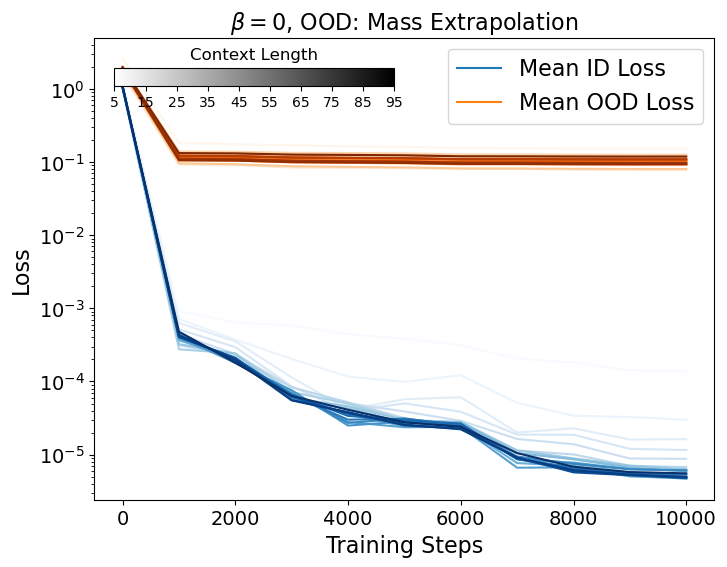

In [10]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

context_lens = np.arange(5,99,5)
cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

fig = plt.figure(figsize=(8,6))
for ic,n_ctx in enumerate(context_lens):
    ictx = n_ctx-1
    mean_ood_performance = []
    mean_id_performance = []
    for n_iter in n_iters:
        dsel = data[n_iter]
        total_loss = 0
        total_n = 0
        for ood in ood_vals:
            im = list(masses).index(ood)
            total_loss += dsel[ictx,im,kcut,ib].sum()
            total_n += dsel[ictx,im,kcut,ib].size
        mean_ood_performance.append(total_loss/total_n)

        total_loss = 0
        total_n = 0
        for id_val in id_vals:
            im = list(masses).index(id_val)
            total_loss += dsel[ictx,im,kcut,ib].sum()
            total_n += dsel[ictx,im,kcut,ib].size
        mean_id_performance.append(total_loss/total_n)

    plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
    plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])
    
#plt.legend(loc='upper right',fontsize=16)
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
plt.yscale('log')

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=context_lens[::2])
cbar_ax.tick_params(labelsize=10)

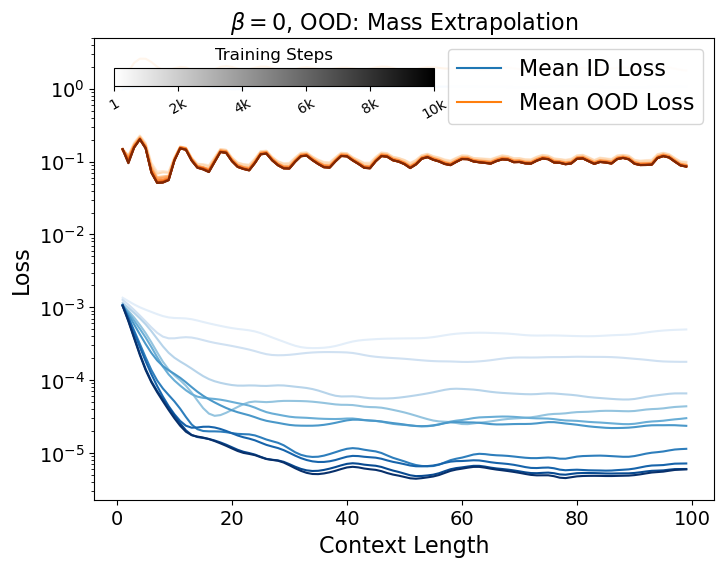

In [11]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

fig = plt.figure(figsize=(8,6))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    
    all_losses = []
    for ood in ood_vals:
        im = list(masses).index(ood)
        all_losses.append(dsel[:,im,kcut,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])
    
    all_losses = []
    for id_val in id_vals:
        im = list(masses).index(id_val)
        all_losses.append(dsel[:,im,kcut,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])
    
    
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.yscale('log')
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Context Length",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
cbar_ax.tick_params(labelsize=10,rotation=30)

Text(0.5, 1.0, '$\\beta = 0$, OOD Performance')

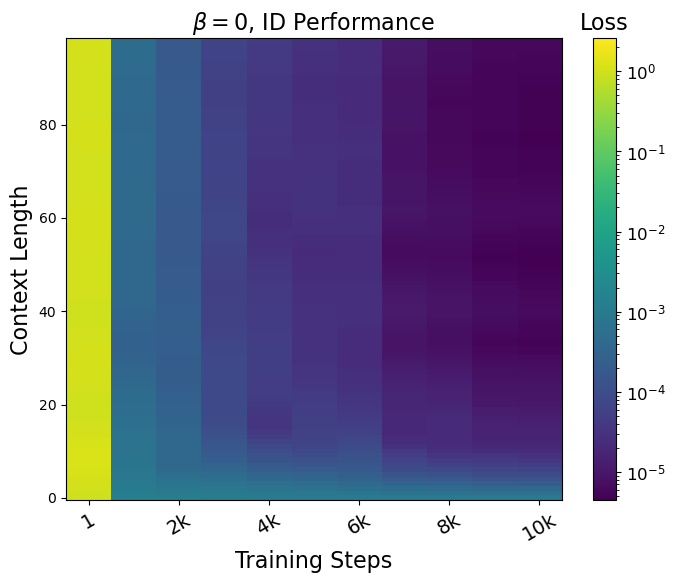

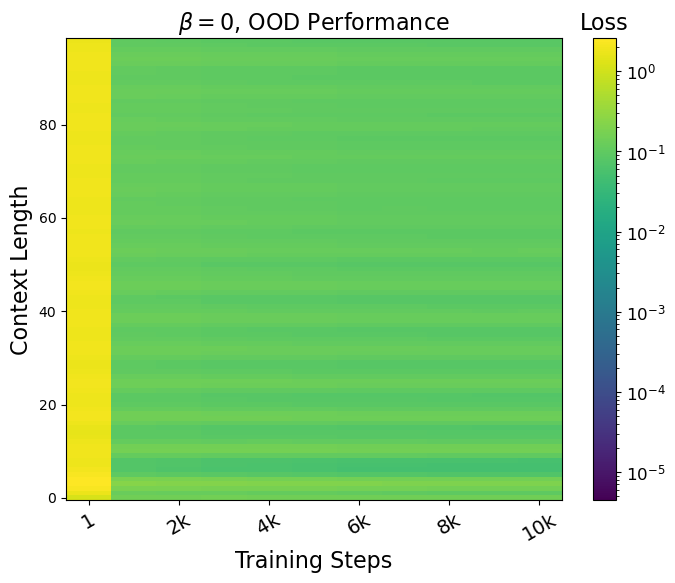

In [12]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

map_ood = np.zeros((len(n_iters),99))
map_id = np.zeros((len(n_iters),99))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    for ictx in np.arange(99):
        loss = []
        for ood in ood_vals:
            im = list(masses).index(ood)
            loss.append(dsel[ictx,im,kcut,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_ood[ii,ictx] = loss
        
        loss = []
        for id_val in id_vals:
            im = list(masses).index(id_val)
            loss.append(dsel[ictx,im,kcut,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_id[ii,ictx] = loss
        
norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))
    
fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_id
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_ood
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### Mass interpolation in [4,5,6]. Trained with full range of $k$

In [13]:
model = "discrete_mkb_mLoHi_kAll_beta0_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [4,5,6]
id_vals = [1,2,3,8,9,10]
kcut = slice(2,-2)

FileNotFoundError: [Errno 2] No such file or directory: 'trainings/discrete_mkb_mLoHi_kAll_beta0_noRoPE/'

In [146]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_mass_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [1,5]

        for i,k_test in enumerate(ks):
            plt.figure(figsize=(8,6))
            ik = list(ks).index(k_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(masses,data[n_iter][n_ctx_test-1,:,ik,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $k = {k_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Mass",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/k{k_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

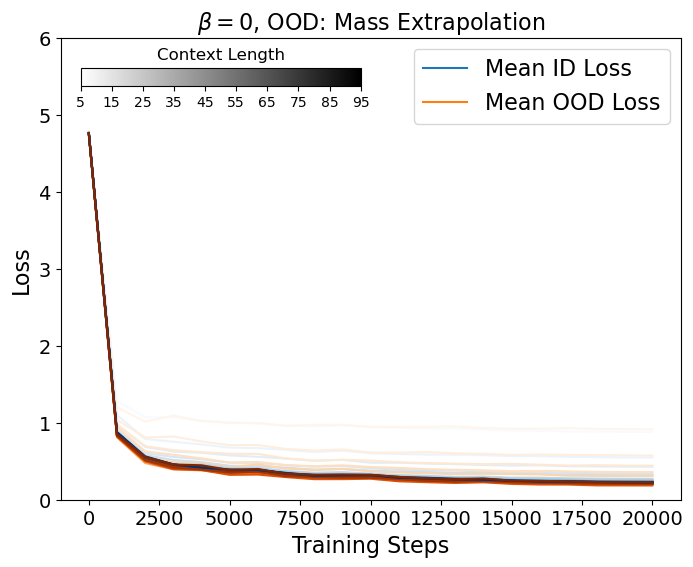

In [179]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

context_lens = np.arange(5,99,5)
cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

fig = plt.figure(figsize=(8,6))
for ic,n_ctx in enumerate(context_lens):
    ictx = n_ctx-1
    mean_ood_performance = []
    mean_id_performance = []
    for n_iter in n_iters:
        dsel = data[n_iter]
        total_loss = 0
        total_n = 0
        for ood in ood_vals:
            im = list(masses).index(ood)
            total_loss += dsel[ictx,im,kcut,ib].sum()
            total_n += dsel[ictx,im,kcut,ib].size
        mean_ood_performance.append(total_loss/total_n)

        total_loss = 0
        total_n = 0
        for id_val in id_vals:
            im = list(masses).index(id_val)
            total_loss += dsel[ictx,im,kcut,ib].sum()
            total_n += dsel[ictx,im,kcut,ib].size
        mean_id_performance.append(total_loss/total_n)

    plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
    plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])
    
#plt.legend(loc='upper right',fontsize=16)
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
plt.ylim([0,6])

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=context_lens[::2])
cbar_ax.tick_params(labelsize=10)

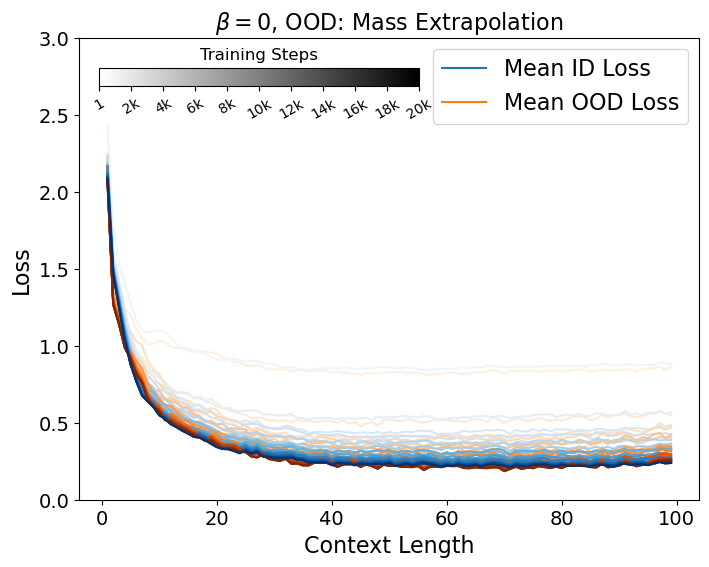

In [181]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

fig = plt.figure(figsize=(8,6))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    
    all_losses = []
    for ood in ood_vals:
        im = list(masses).index(ood)
        all_losses.append(dsel[:,im,kcut,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])
    
    all_losses = []
    for id_val in id_vals:
        im = list(masses).index(id_val)
        all_losses.append(dsel[:,im,kcut,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])
    
    
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.ylim([0,6])
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Context Length",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
plt.ylim([0,3])

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
cbar_ax.tick_params(labelsize=10,rotation=30)

Text(0.5, 1.0, '$\\beta = 0$, OOD Performance')

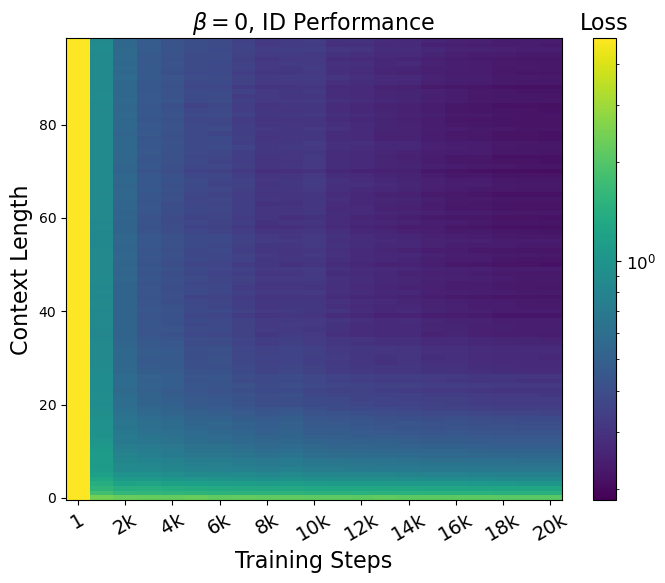

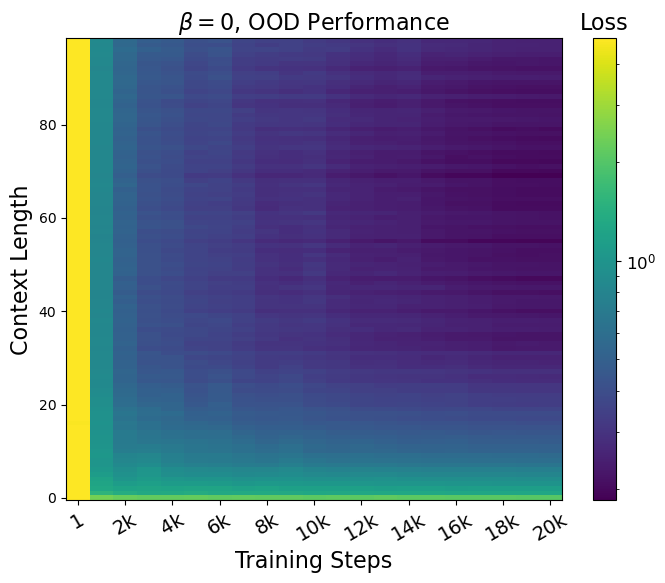

In [182]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

map_ood = np.zeros((len(n_iters),99))
map_id = np.zeros((len(n_iters),99))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    for ictx in np.arange(99):
        loss = []
        for ood in ood_vals:
            im = list(masses).index(ood)
            loss.append(dsel[ictx,im,kcut,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_ood[ii,ictx] = loss
        
        loss = []
        for id_val in id_vals:
            im = list(masses).index(id_val)
            loss.append(dsel[ictx,im,kcut,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_id[ii,ictx] = loss
        
norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))
    
fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_id
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_ood
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

## Generalization in $k$: extrapolation and interpolation

### Low --> High $k$ extrapolation. Trained with full range of $m$

In [14]:
model = "discrete_mkb_mAll_kLo_beta0_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [16,17,18,19,20]
id_vals = [10,11,12,13,14,15]
mcut = slice(3,-2)

In [154]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_k_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [10,15]

        for i,m_test in enumerate(masses):
            plt.figure(figsize=(8,6))
            im = list(masses).index(m_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(ks,data[n_iter][n_ctx_test-1,im,:,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $M = {m_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Spring Constant",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/m{m_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

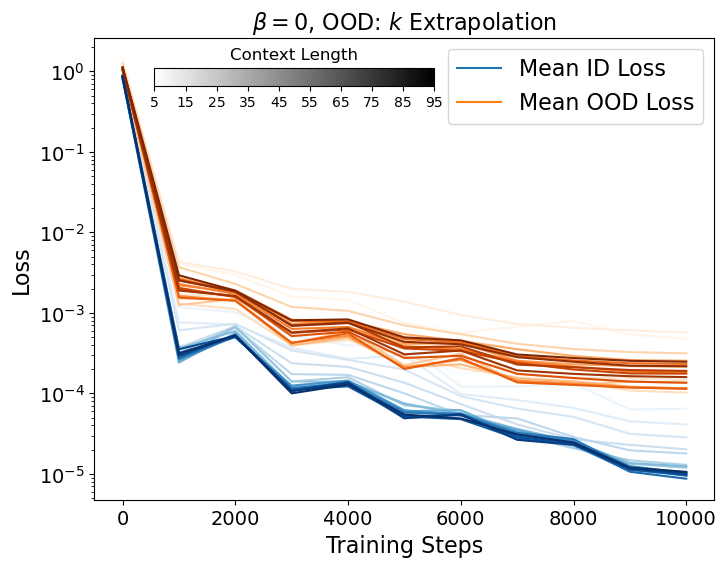

In [15]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

context_lens = np.arange(5,99,5)
cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

fig = plt.figure(figsize=(8,6))
for ic,n_ctx in enumerate(context_lens):
    ictx = n_ctx-1
    mean_ood_performance = []
    mean_id_performance = []
    for n_iter in n_iters:
        dsel = data[n_iter]
        total_loss = 0
        total_n = 0
        for ood in ood_vals:
            ik = list(ks).index(ood)
            total_loss += dsel[ictx,mcut,ik,ib].sum()
            total_n += dsel[ictx,mcut,ik,ib].size
        mean_ood_performance.append(total_loss/total_n)

        total_loss = 0
        total_n = 0
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            total_loss += dsel[ictx,mcut,ik,ib].sum()
            total_n += dsel[ictx,mcut,ik,ib].size
        mean_id_performance.append(total_loss/total_n)

    plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
    plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])
    
#plt.legend(loc='upper right',fontsize=16)
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
plt.yscale('log')

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=context_lens[::2])
cbar_ax.tick_params(labelsize=10)

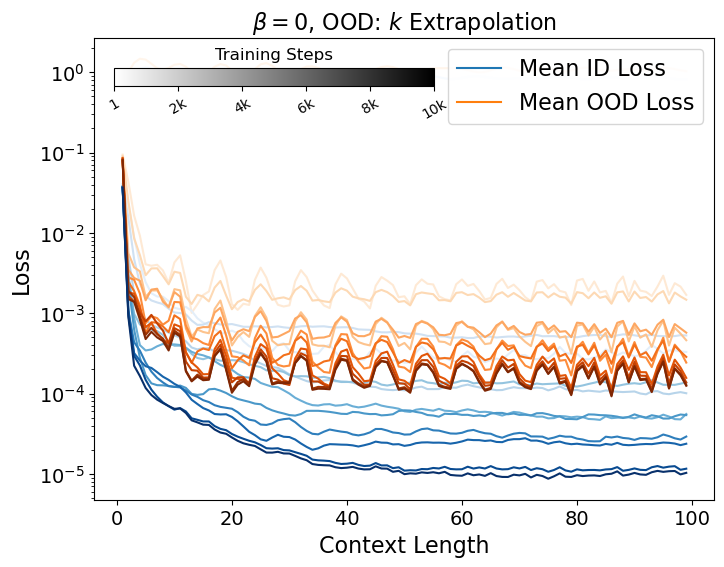

In [16]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

fig = plt.figure(figsize=(8,6))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    
    all_losses = []
    for ood in ood_vals:
        ik = list(ks).index(ood)
        all_losses.append(dsel[:,mcut,ik,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])
    
    all_losses = []
    for id_val in id_vals:
        ik = list(ks).index(id_val)
        all_losses.append(dsel[:,mcut,ik,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])
    
    
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Context Length",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
plt.yscale('log')

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
cbar_ax.tick_params(labelsize=10,rotation=30)

Text(0.5, 1.0, '$\\beta = 0$, OOD Performance')

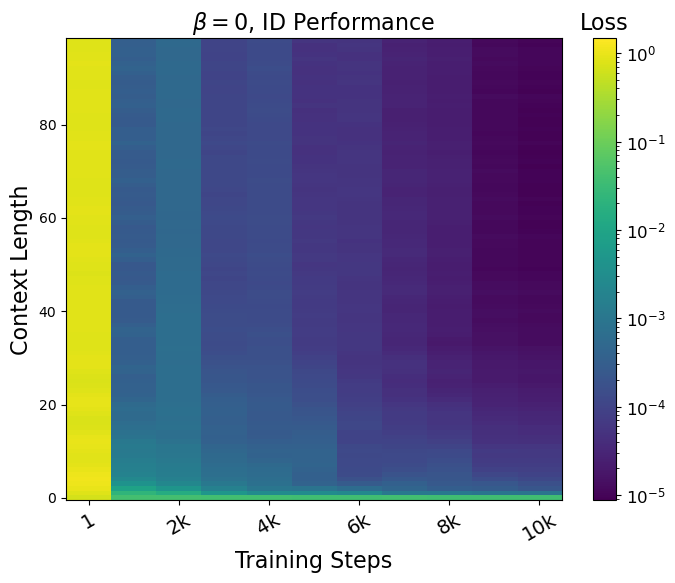

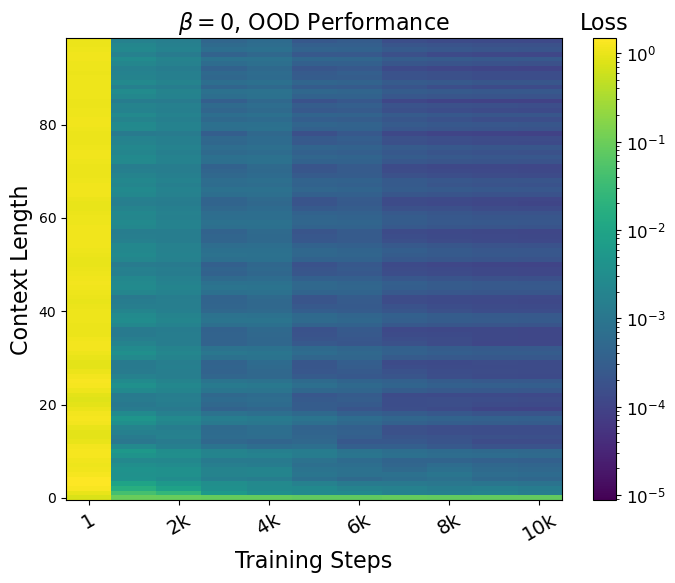

In [17]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

map_ood = np.zeros((len(n_iters),99))
map_id = np.zeros((len(n_iters),99))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    for ictx in np.arange(99):
        loss = []
        for ood in ood_vals:
            ik = list(ks).index(ood)
            loss.append(dsel[ictx,mcut,ik,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_ood[ii,ictx] = loss
        
        loss = []
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            loss.append(dsel[ictx,mcut,ik,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_id[ii,ictx] = loss
        
norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))
    
fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_id
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_ood
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### High --> Low $k$ extrapolation. Trained with full range of $m$

In [18]:
model = "discrete_mkb_mAll_kHi_beta0_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [10,11,12,13,14,15]
id_vals = [16,17,18,19,20]
mcut = slice(3,-2)

FileNotFoundError: [Errno 2] No such file or directory: 'trainings/discrete_mkb_mAll_kHi_beta0_noRoPE/'

In [189]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_k_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [10,15]

        for i,m_test in enumerate(masses):
            plt.figure(figsize=(8,6))
            im = list(masses).index(m_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(ks,data[n_iter][n_ctx_test-1,im,:,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $M = {m_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Spring Constant",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/m{m_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

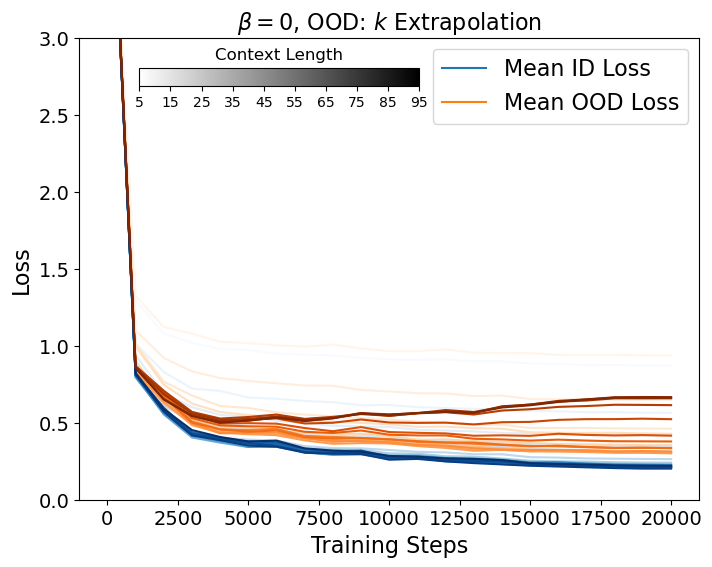

In [190]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

context_lens = np.arange(5,99,5)
cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

fig = plt.figure(figsize=(8,6))
for ic,n_ctx in enumerate(context_lens):
    ictx = n_ctx-1
    mean_ood_performance = []
    mean_id_performance = []
    for n_iter in n_iters:
        dsel = data[n_iter]
        total_loss = 0
        total_n = 0
        for ood in ood_vals:
            ik = list(ks).index(ood)
            total_loss += dsel[ictx,mcut,ik,ib].sum()
            total_n += dsel[ictx,mcut,ik,ib].size
        mean_ood_performance.append(total_loss/total_n)

        total_loss = 0
        total_n = 0
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            total_loss += dsel[ictx,mcut,ik,ib].sum()
            total_n += dsel[ictx,mcut,ik,ib].size
        mean_id_performance.append(total_loss/total_n)

    plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
    plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])
    
#plt.legend(loc='upper right',fontsize=16)
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
plt.ylim([0,3])

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=context_lens[::2])
cbar_ax.tick_params(labelsize=10)

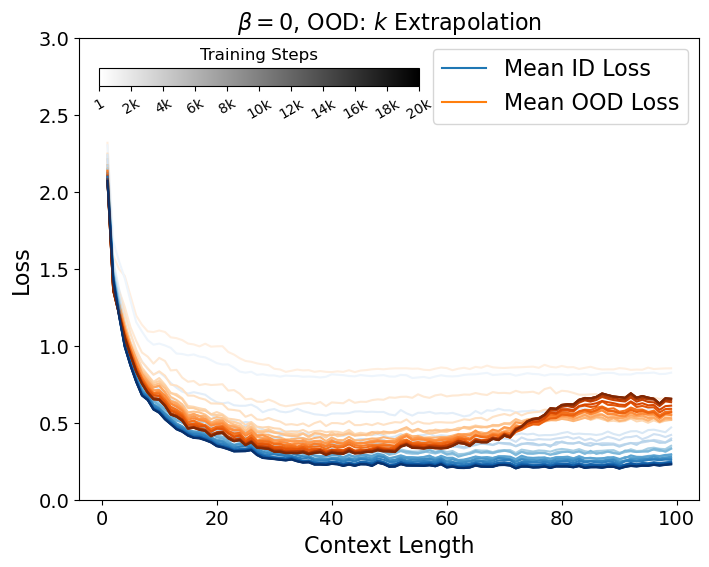

In [191]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

fig = plt.figure(figsize=(8,6))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    
    all_losses = []
    for ood in ood_vals:
        ik = list(ks).index(ood)
        all_losses.append(dsel[:,mcut,ik,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])
    
    all_losses = []
    for id_val in id_vals:
        ik = list(ks).index(id_val)
        all_losses.append(dsel[:,mcut,ik,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])
    
    
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Context Length",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
plt.ylim([0,3])

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
cbar_ax.tick_params(labelsize=10,rotation=30)

Text(0.5, 1.0, '$\\beta = 0$, OOD Performance')

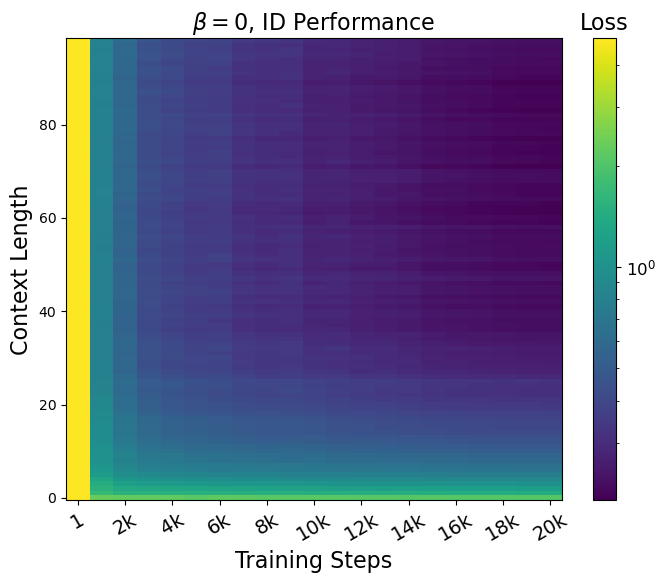

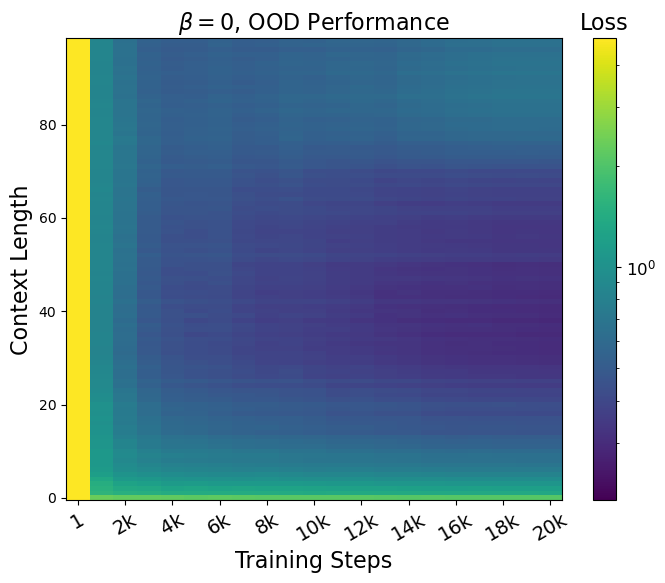

In [192]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

map_ood = np.zeros((len(n_iters),99))
map_id = np.zeros((len(n_iters),99))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    for ictx in np.arange(99):
        loss = []
        for ood in ood_vals:
            ik = list(ks).index(ood)
            loss.append(dsel[ictx,mcut,ik,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_ood[ii,ictx] = loss
        
        loss = []
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            loss.append(dsel[ictx,mcut,ik,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_id[ii,ictx] = loss
        
norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))
    
fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_id
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_ood
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### $k$ Interpolation. Trained with full range of $m$

In [195]:
model = "tokenized_discrete_mkb_mAll_kLoHi_beta0"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [14,15,16]
id_vals = [10,11,12,13,17,18,19,20]
mcut = slice(3,-2)

In [196]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_k_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [10,15]

        for i,m_test in enumerate(masses):
            plt.figure(figsize=(8,6))
            im = list(masses).index(m_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(ks,data[n_iter][n_ctx_test-1,im,:,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $M = {m_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Spring Constant",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/m{m_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

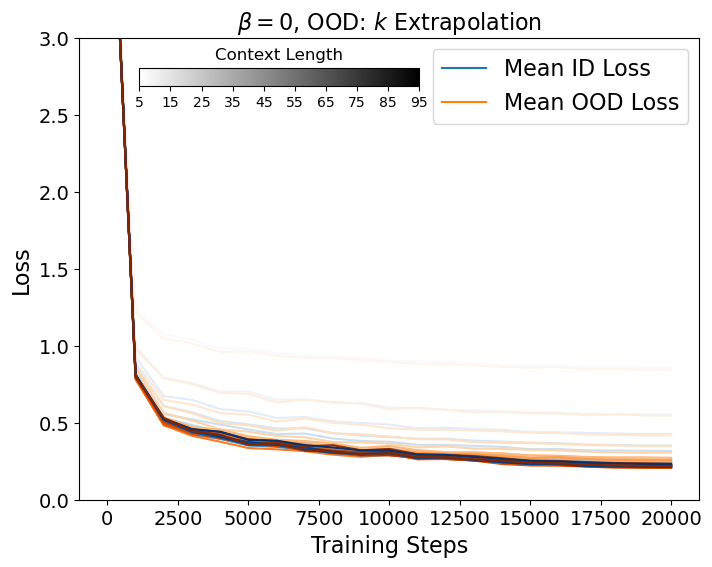

In [197]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

context_lens = np.arange(5,99,5)
cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

fig = plt.figure(figsize=(8,6))
for ic,n_ctx in enumerate(context_lens):
    ictx = n_ctx-1
    mean_ood_performance = []
    mean_id_performance = []
    for n_iter in n_iters:
        dsel = data[n_iter]
        total_loss = 0
        total_n = 0
        for ood in ood_vals:
            ik = list(ks).index(ood)
            total_loss += dsel[ictx,mcut,ik,ib].sum()
            total_n += dsel[ictx,mcut,ik,ib].size
        mean_ood_performance.append(total_loss/total_n)

        total_loss = 0
        total_n = 0
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            total_loss += dsel[ictx,mcut,ik,ib].sum()
            total_n += dsel[ictx,mcut,ik,ib].size
        mean_id_performance.append(total_loss/total_n)

    plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
    plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])
    
#plt.legend(loc='upper right',fontsize=16)
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
plt.ylim([0,3])

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=context_lens[::2])
cbar_ax.tick_params(labelsize=10)

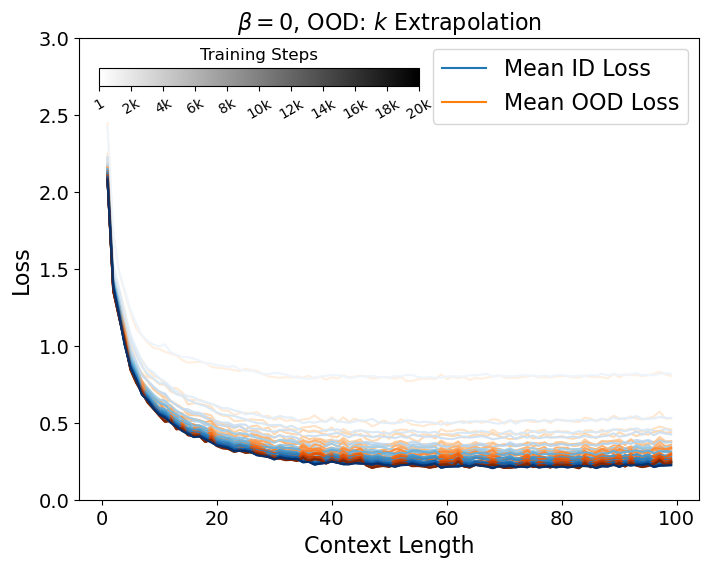

In [198]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

cmap_blues = plt.get_cmap('Blues')
cmap_oranges = plt.get_cmap("Oranges")
colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

fig = plt.figure(figsize=(8,6))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    
    all_losses = []
    for ood in ood_vals:
        ik = list(ks).index(ood)
        all_losses.append(dsel[:,mcut,ik,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])
    
    all_losses = []
    for id_val in id_vals:
        ik = list(ks).index(id_val)
        all_losses.append(dsel[:,mcut,ik,ib])
    all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
    plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])
    
    
line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
plt.xlabel("Context Length",fontsize=16)
plt.ylabel("Loss",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
plt.ylim([0,3])

# Add a custom colorbar on top
cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

# Customize the colorbar
cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
cbar_ax.tick_params(labelsize=10,rotation=30)

Text(0.5, 1.0, '$\\beta = 0$, OOD Performance')

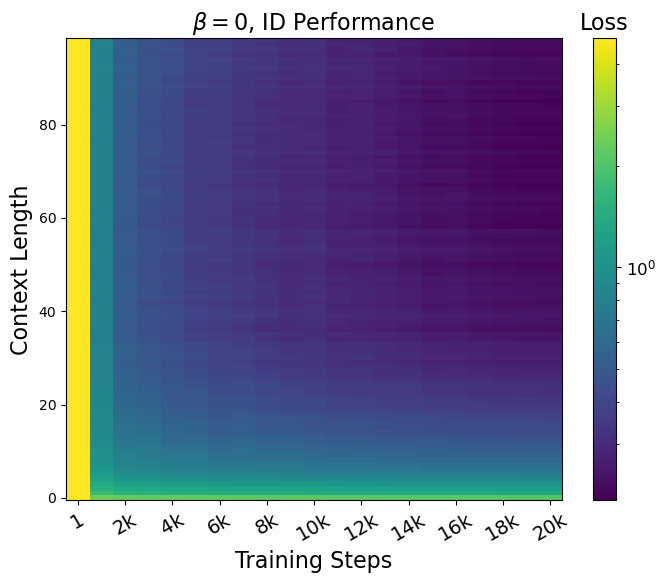

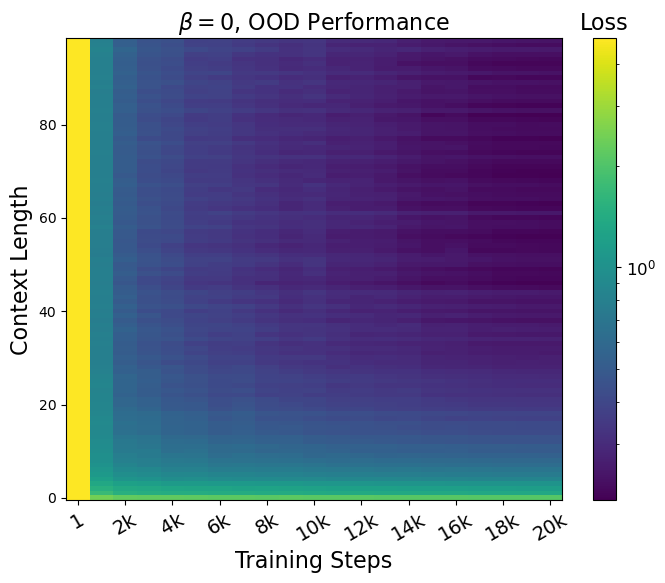

In [199]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

beta = 0
ib = list(betas).index(beta)

map_ood = np.zeros((len(n_iters),99))
map_id = np.zeros((len(n_iters),99))
for ii,n_iter in enumerate(n_iters):
    dsel = data[n_iter]
    for ictx in np.arange(99):
        loss = []
        for ood in ood_vals:
            ik = list(ks).index(ood)
            loss.append(dsel[ictx,mcut,ik,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_ood[ii,ictx] = loss
        
        loss = []
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            loss.append(dsel[ictx,mcut,ik,ib])
        loss = np.concatenate(loss,axis=0).mean()
        map_id[ii,ictx] = loss
        
norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))
    
fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_id
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

fig = plt.figure(figsize=(8,6))
X, Y = np.meshgrid(n_iters, np.arange(99)+1)
Z = map_ood
heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
cbar=plt.colorbar()
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_title("Loss", fontsize=16)
plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
          rotation=30,fontsize=14)
plt.xlabel("Training Steps",fontsize=16)
plt.ylabel("Context Length",fontsize=16)
plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

# Damped Trainings

## Generalization in mass: extrapolation and interpolation

### Low --> High mass extrapolation. Trained with full range of $k$

In [19]:
model = "discrete_mkb_mLo_kAll_betaAll_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [6,7,8,9,10]
id_vals = [1,2,3,4,5]
kcut = slice(2,-2)

In [136]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_mass_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [1,5]

        for i,k_test in enumerate(ks):
            plt.figure(figsize=(8,6))
            ik = list(ks).index(k_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(masses,data[n_iter][n_ctx_test-1,:,ik,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $k = {k_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Mass",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/k{k_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

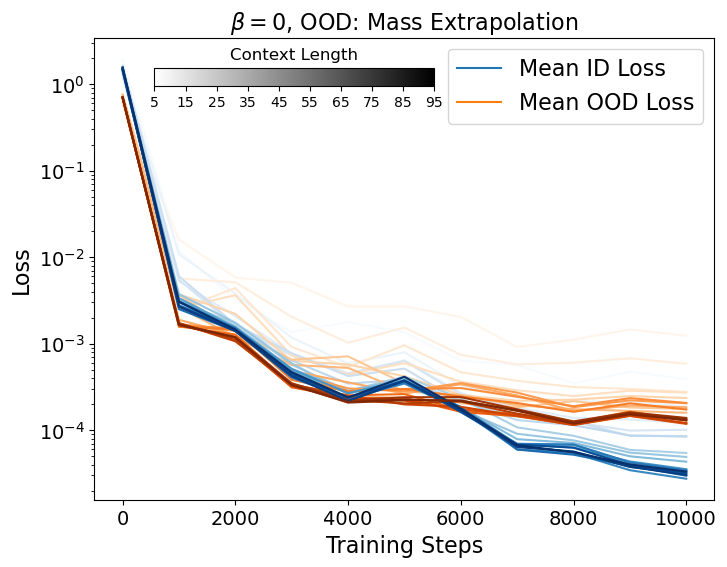

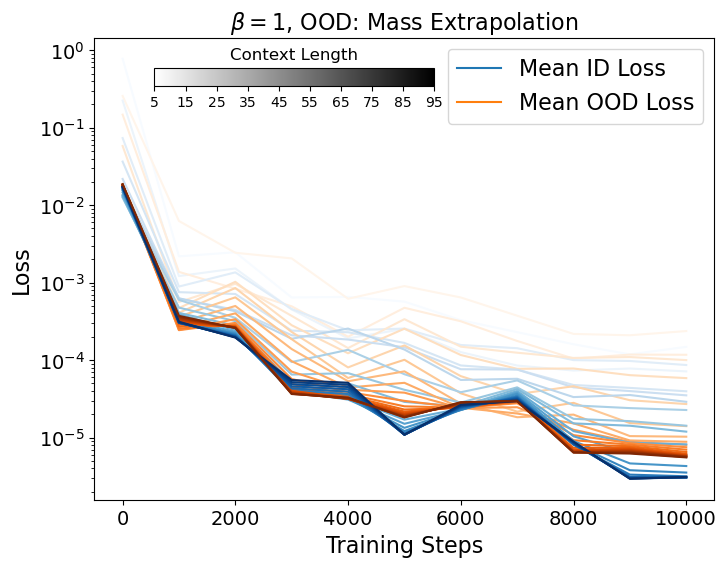

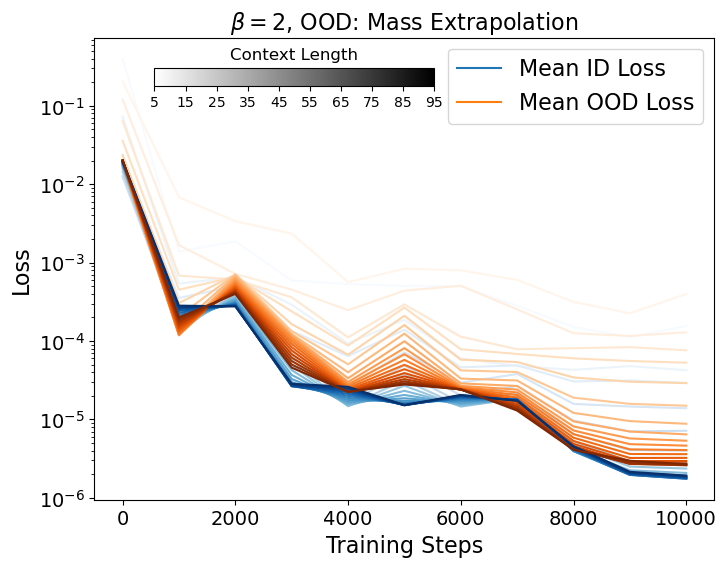

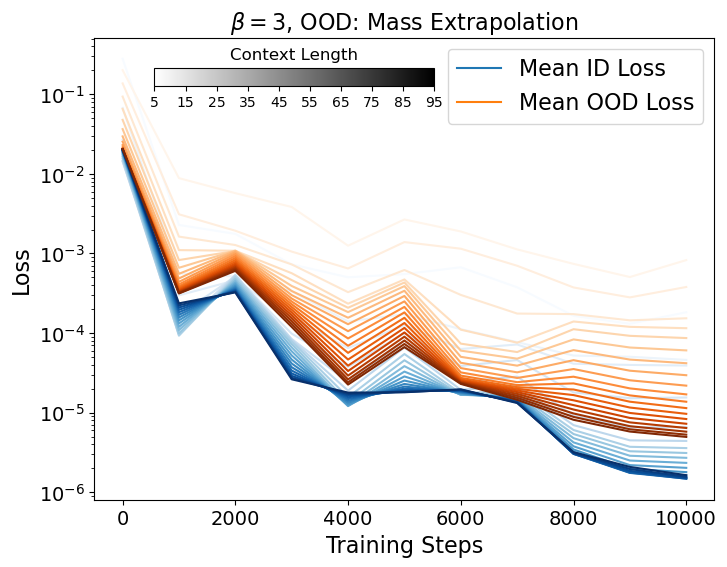

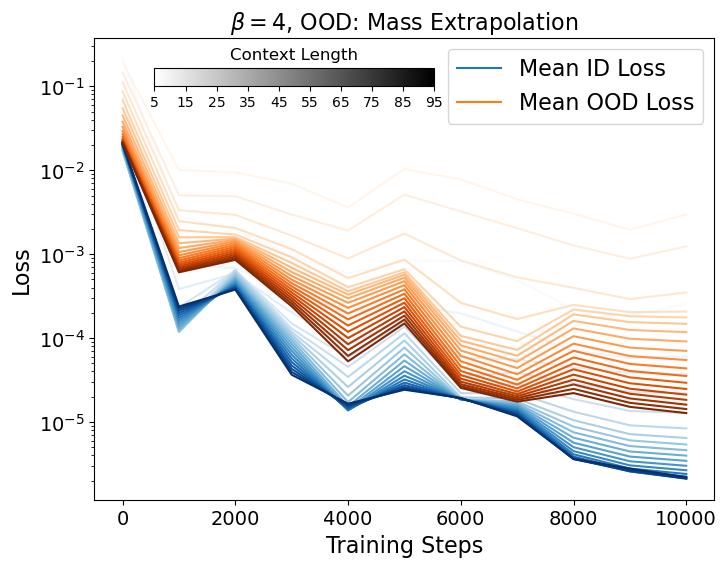

In [20]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    context_lens = np.arange(5,99,5)
    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
    colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

    fig = plt.figure(figsize=(8,6))
    for ic,n_ctx in enumerate(context_lens):
        ictx = n_ctx-1
        mean_ood_performance = []
        mean_id_performance = []
        for n_iter in n_iters:
            dsel = data[n_iter]
            total_loss = 0
            total_n = 0
            for ood in ood_vals:
                im = list(masses).index(ood)
                total_loss += dsel[ictx,im,kcut,ib].sum()
                total_n += dsel[ictx,im,kcut,ib].size
            mean_ood_performance.append(total_loss/total_n)

            total_loss = 0
            total_n = 0
            for id_val in id_vals:
                im = list(masses).index(id_val)
                total_loss += dsel[ictx,im,kcut,ib].sum()
                total_n += dsel[ictx,im,kcut,ib].size
            mean_id_performance.append(total_loss/total_n)

        plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
        plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])

    #plt.legend(loc='upper right',fontsize=16)
    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=context_lens[::2])
    cbar_ax.tick_params(labelsize=10)

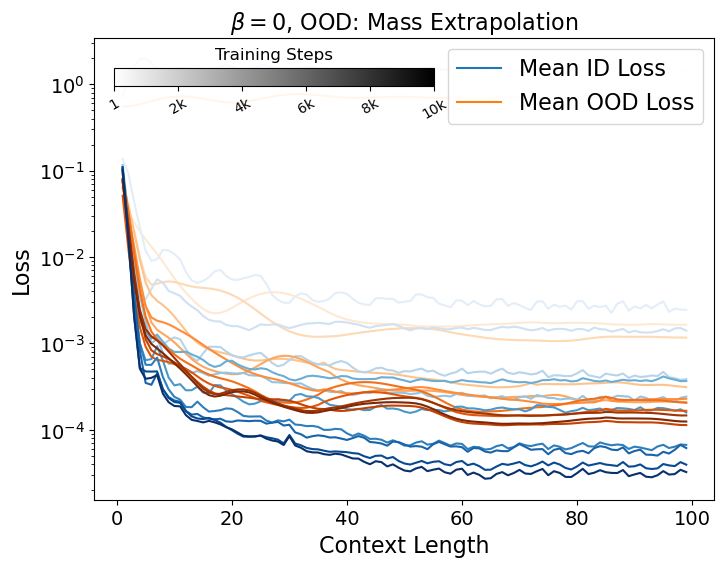

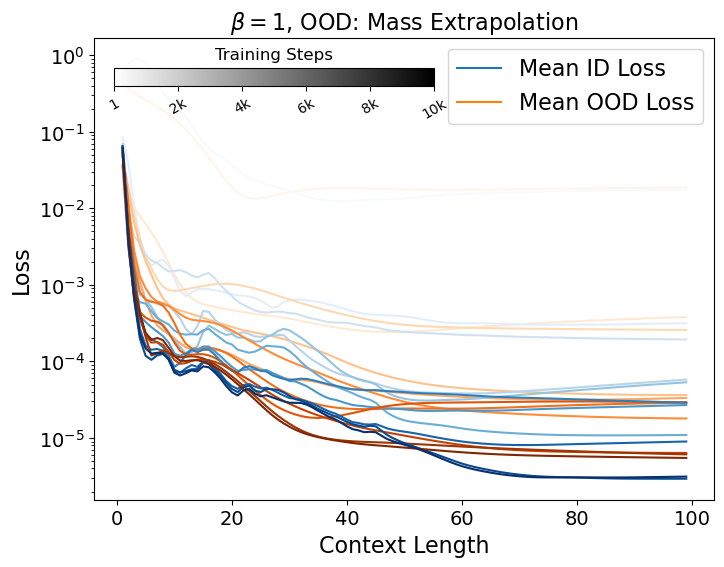

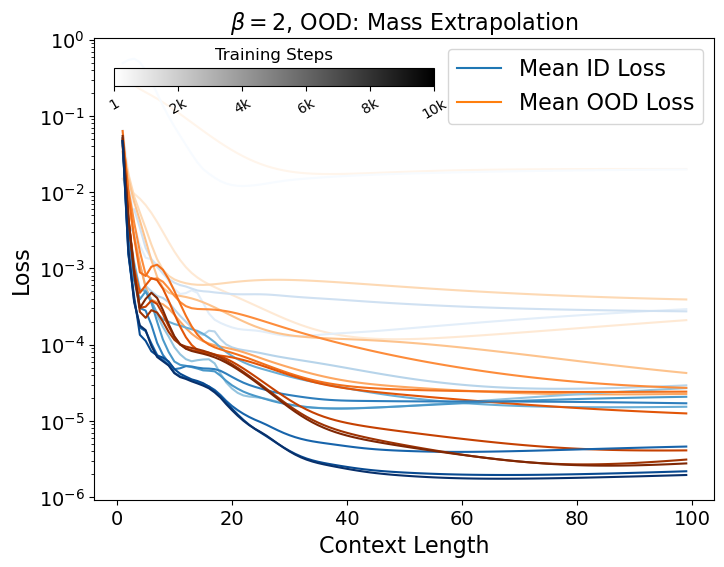

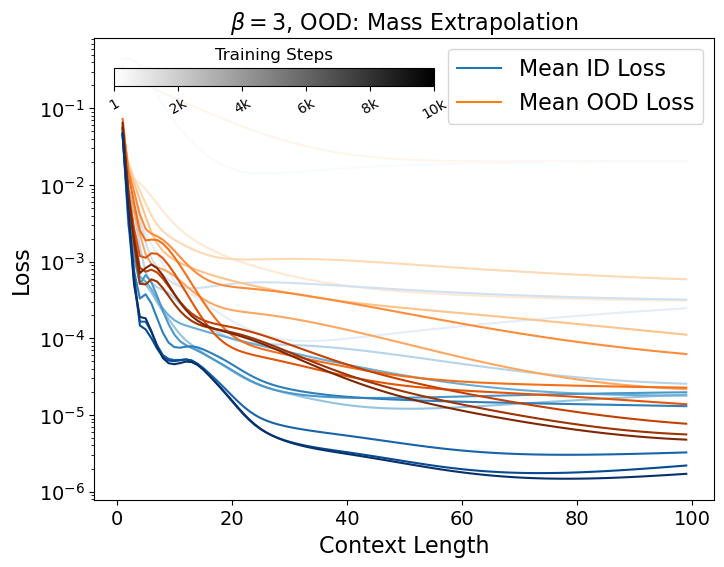

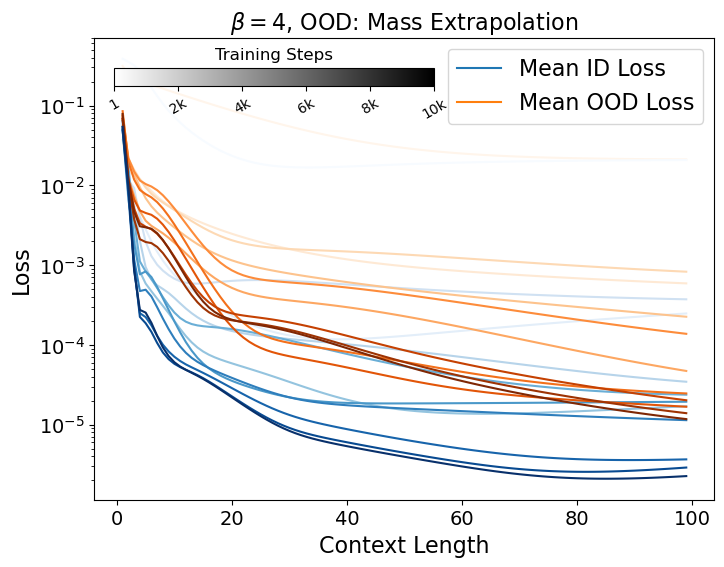

In [21]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
    colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

    fig = plt.figure(figsize=(8,6))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]

        all_losses = []
        for ood in ood_vals:
            im = list(masses).index(ood)
            all_losses.append(dsel[:,im,kcut,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])

        all_losses = []
        for id_val in id_vals:
            im = list(masses).index(id_val)
            all_losses.append(dsel[:,im,kcut,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])


    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Context Length",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
    cbar_ax.tick_params(labelsize=10,rotation=30)

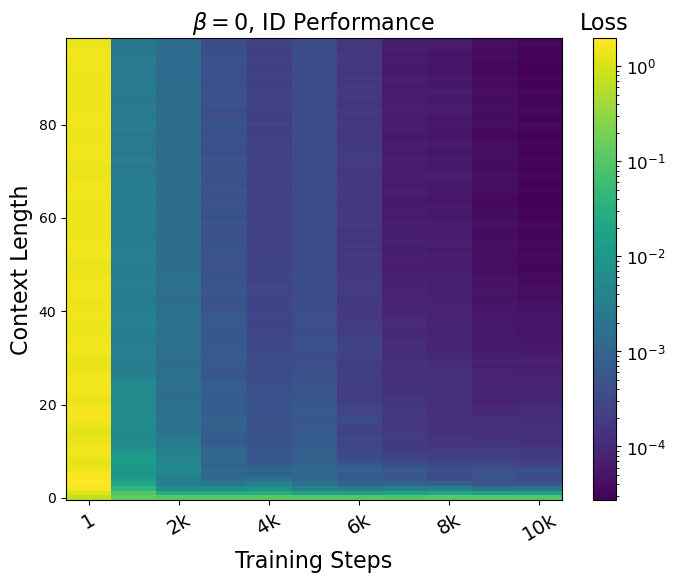

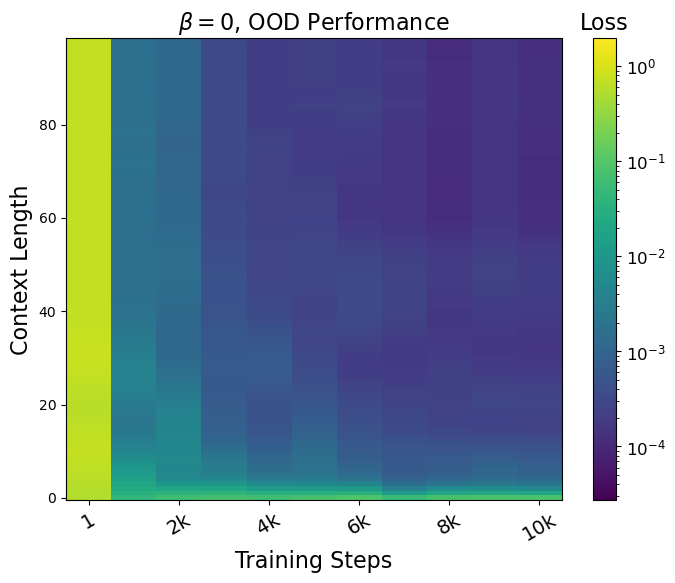

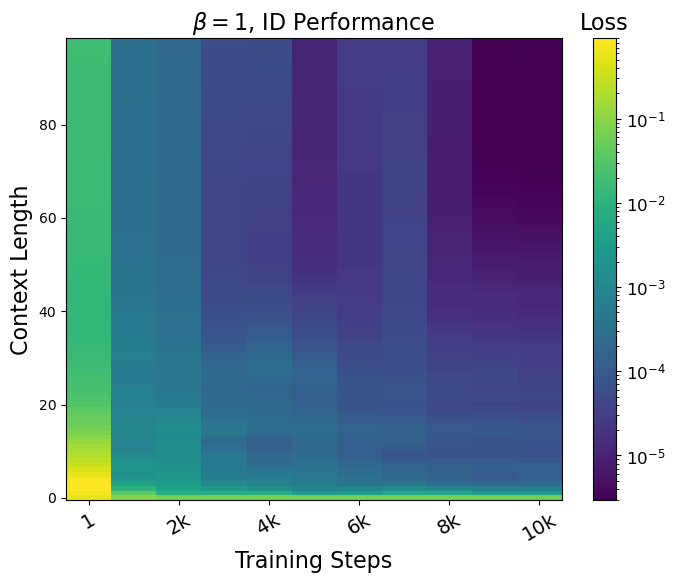

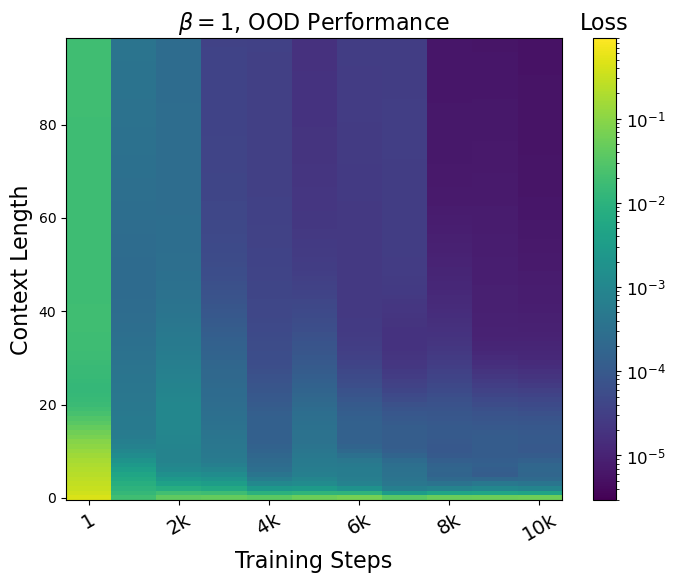

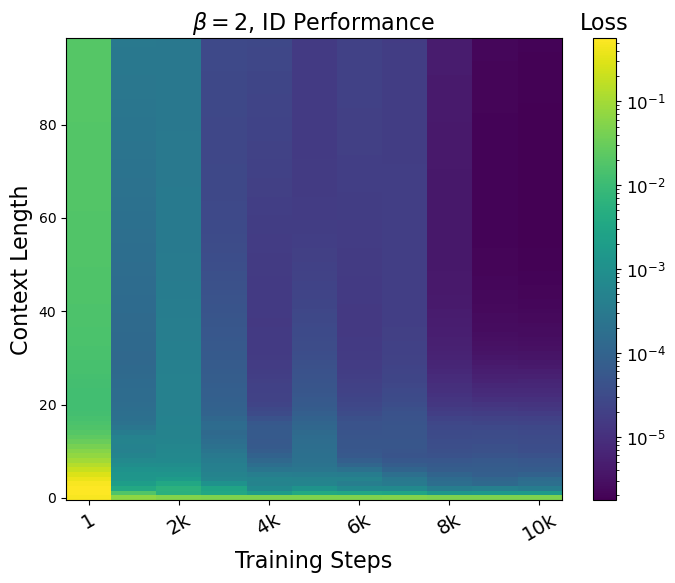

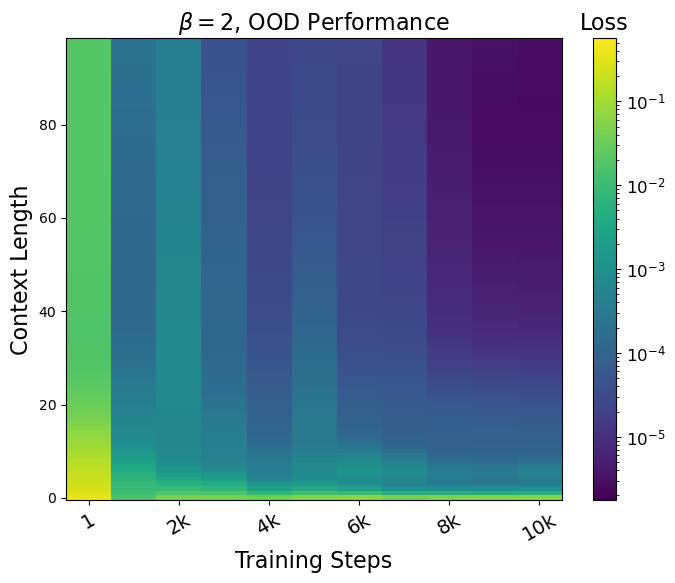

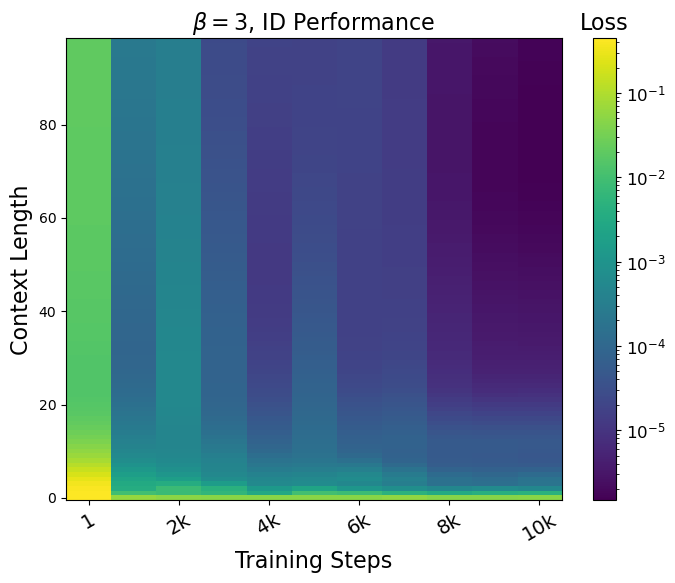

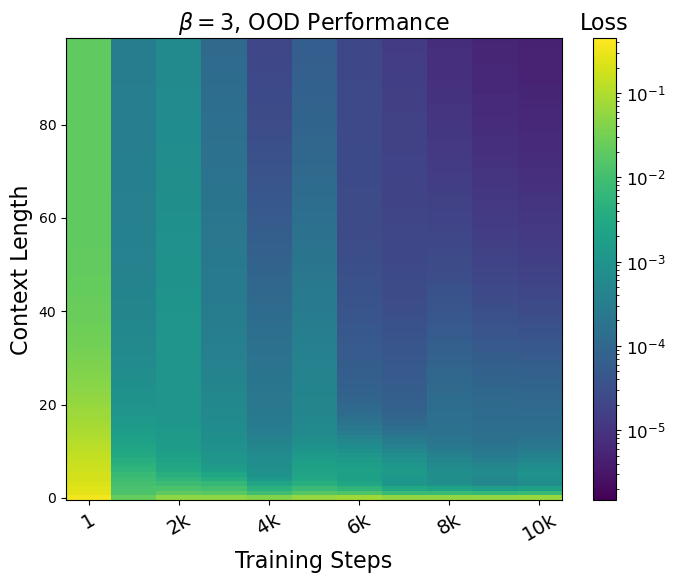

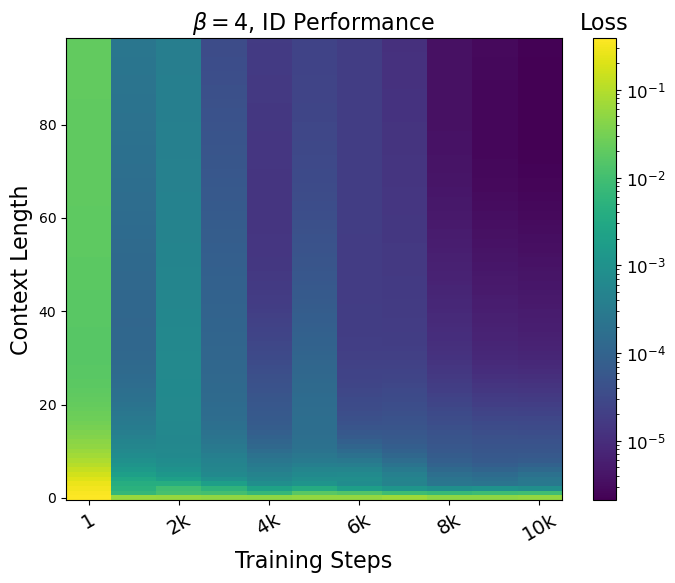

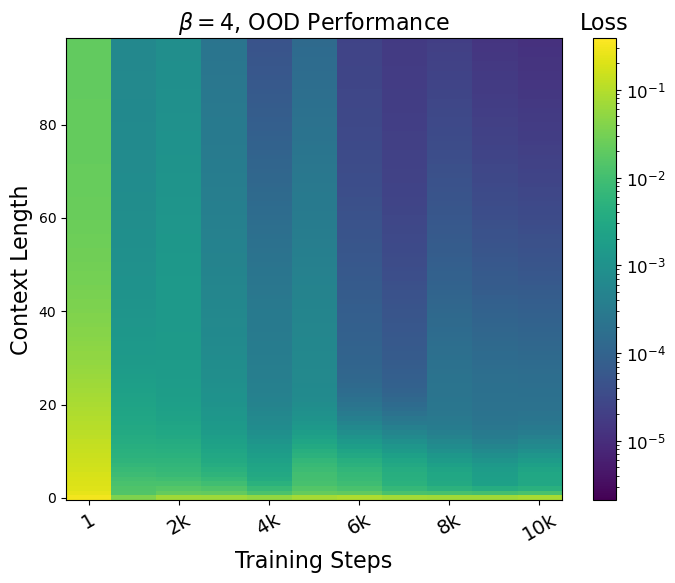

In [22]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    map_ood = np.zeros((len(n_iters),99))
    map_id = np.zeros((len(n_iters),99))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]
        for ictx in np.arange(99):
            loss = []
            for ood in ood_vals:
                im = list(masses).index(ood)
                loss.append(dsel[ictx,im,kcut,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_ood[ii,ictx] = loss

            loss = []
            for id_val in id_vals:
                im = list(masses).index(id_val)
                loss.append(dsel[ictx,im,kcut,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_id[ii,ictx] = loss

    norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_id
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_ood
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### Hi --> Lo mass extrapolation. Trained with full range of $k$

In [23]:
model = "discrete_mkb_mHi_kAll_betaAll_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [1,2,3,4,5]
id_vals = [6,7,8,9,10]
kcut = slice(2,-2)

KeyboardInterrupt: 

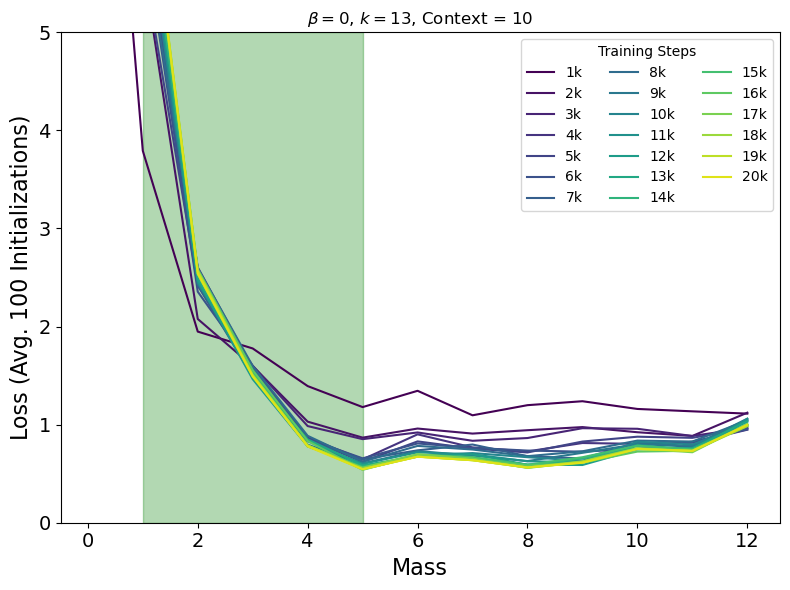

In [208]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_mass_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [1,5]

        for i,k_test in enumerate(ks):
            plt.figure(figsize=(8,6))
            ik = list(ks).index(k_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(masses,data[n_iter][n_ctx_test-1,:,ik,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $k = {k_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Mass",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/k{k_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

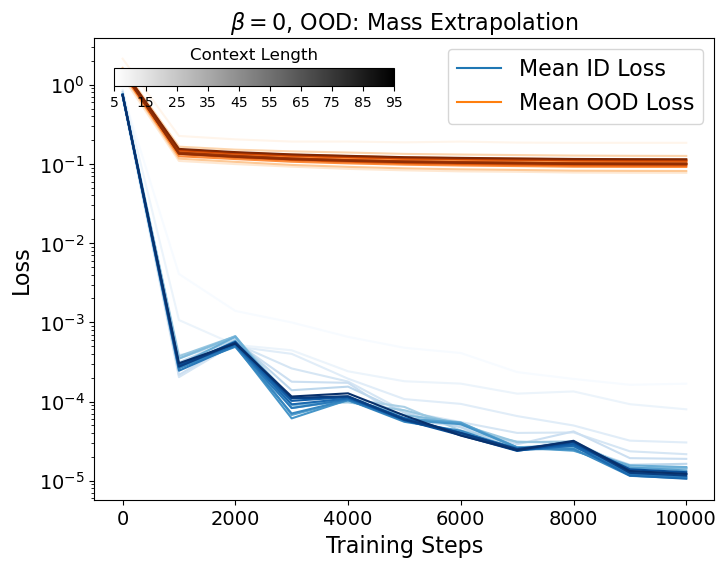

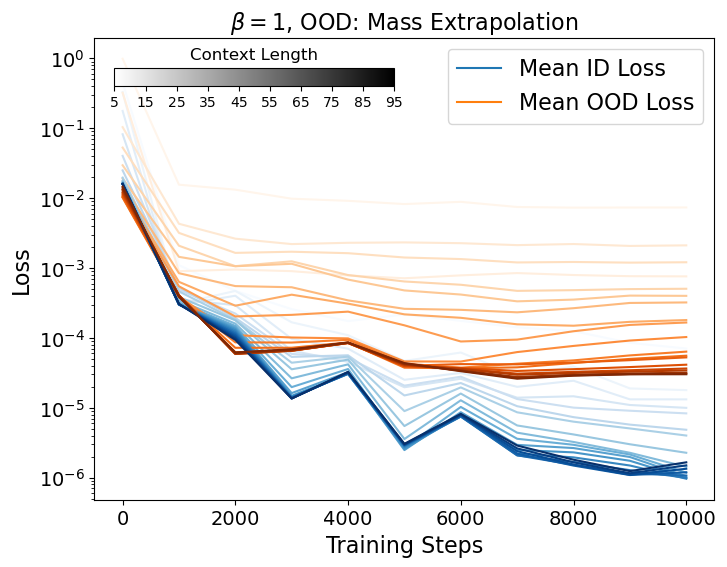

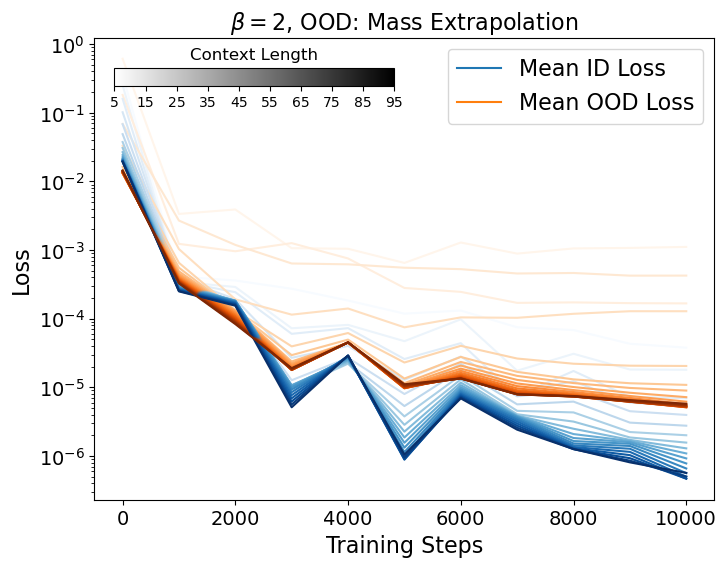

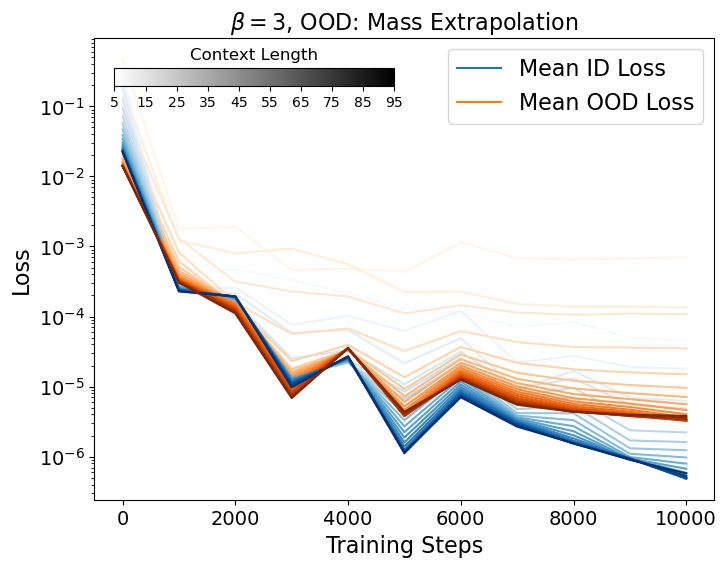

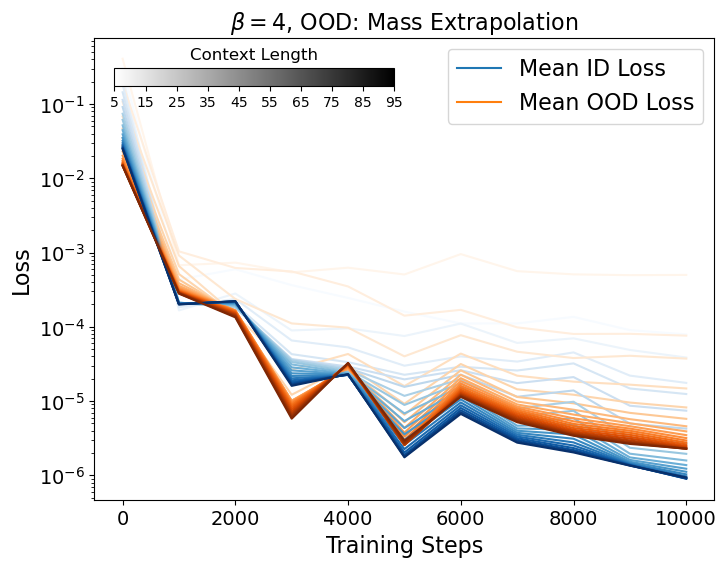

In [24]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    context_lens = np.arange(5,99,5)
    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
    colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

    fig = plt.figure(figsize=(8,6))
    for ic,n_ctx in enumerate(context_lens):
        ictx = n_ctx-1
        mean_ood_performance = []
        mean_id_performance = []
        for n_iter in n_iters:
            dsel = data[n_iter]
            total_loss = 0
            total_n = 0
            for ood in ood_vals:
                im = list(masses).index(ood)
                total_loss += dsel[ictx,im,kcut,ib].sum()
                total_n += dsel[ictx,im,kcut,ib].size
            mean_ood_performance.append(total_loss/total_n)

            total_loss = 0
            total_n = 0
            for id_val in id_vals:
                im = list(masses).index(id_val)
                total_loss += dsel[ictx,im,kcut,ib].sum()
                total_n += dsel[ictx,im,kcut,ib].size
            mean_id_performance.append(total_loss/total_n)

        plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
        plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])

    #plt.legend(loc='upper right',fontsize=16)
    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
    #plt.ylim([0,6])
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=context_lens[::2])
    cbar_ax.tick_params(labelsize=10)

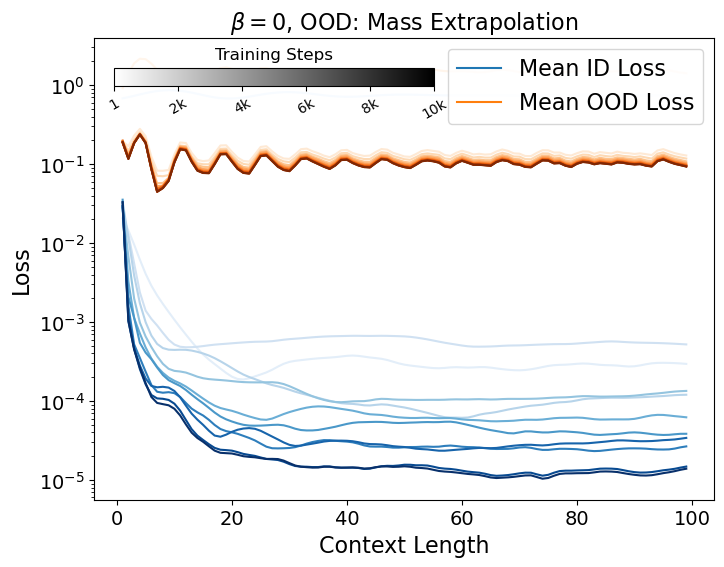

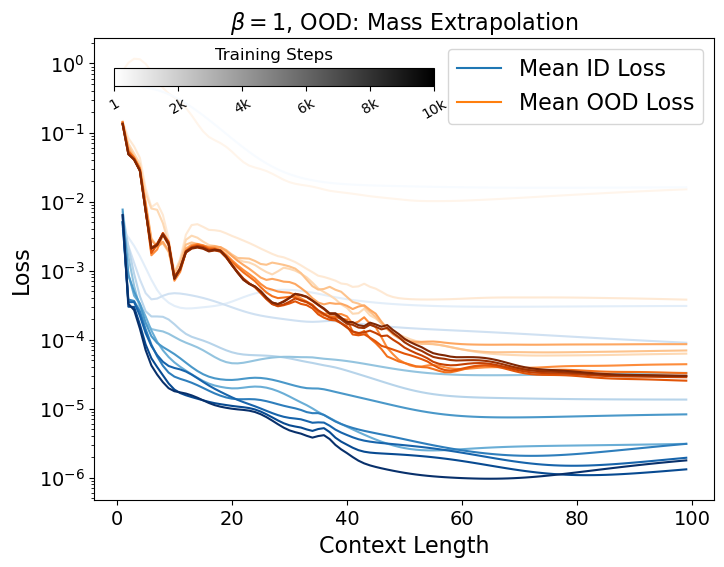

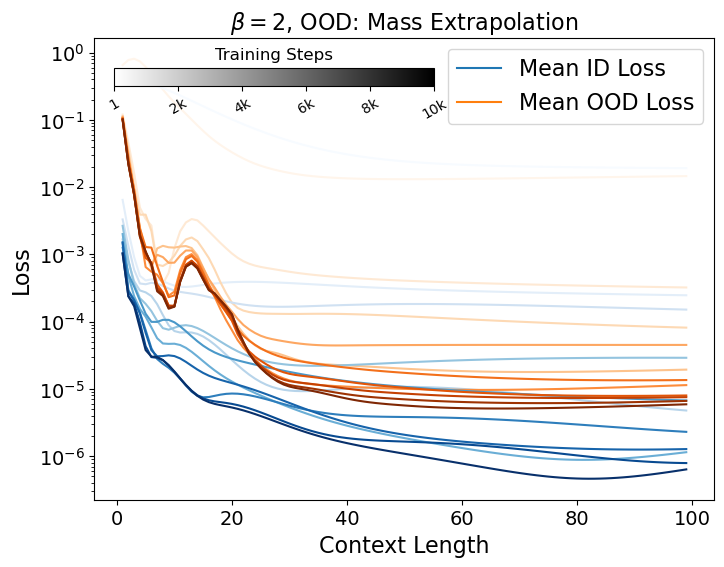

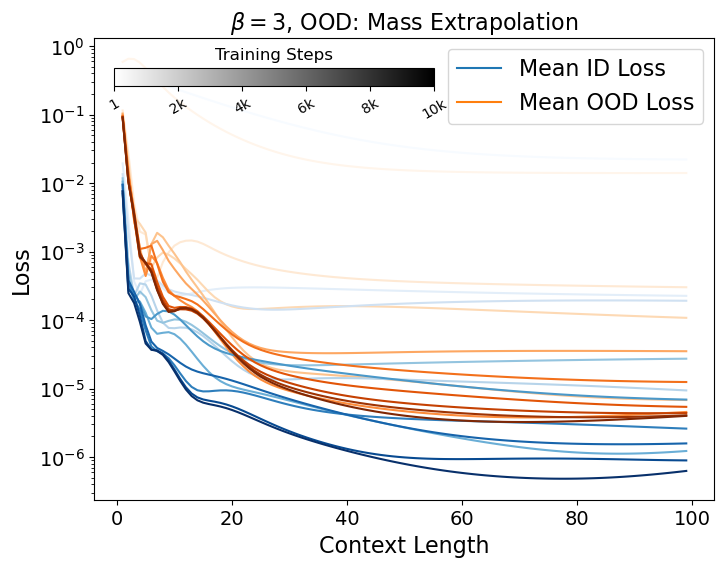

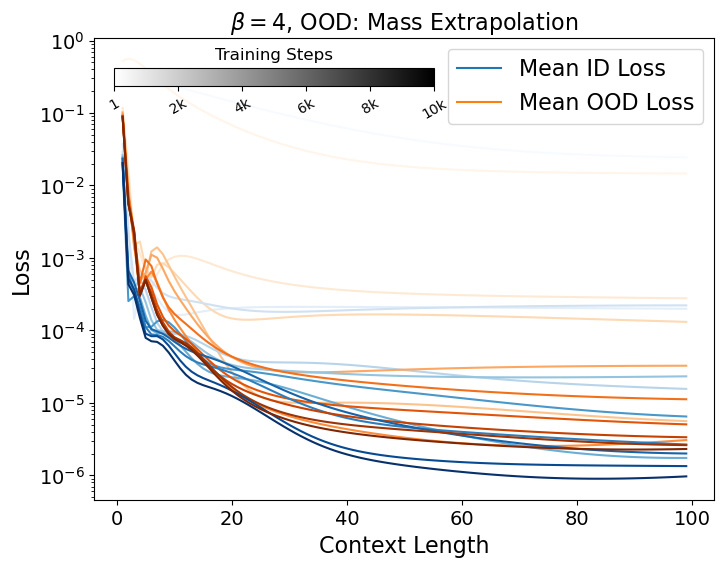

In [25]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
    colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

    fig = plt.figure(figsize=(8,6))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]

        all_losses = []
        for ood in ood_vals:
            im = list(masses).index(ood)
            all_losses.append(dsel[:,im,kcut,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])

        all_losses = []
        for id_val in id_vals:
            im = list(masses).index(id_val)
            all_losses.append(dsel[:,im,kcut,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])


    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.yscale('log')
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Context Length",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
    cbar_ax.tick_params(labelsize=10,rotation=30)

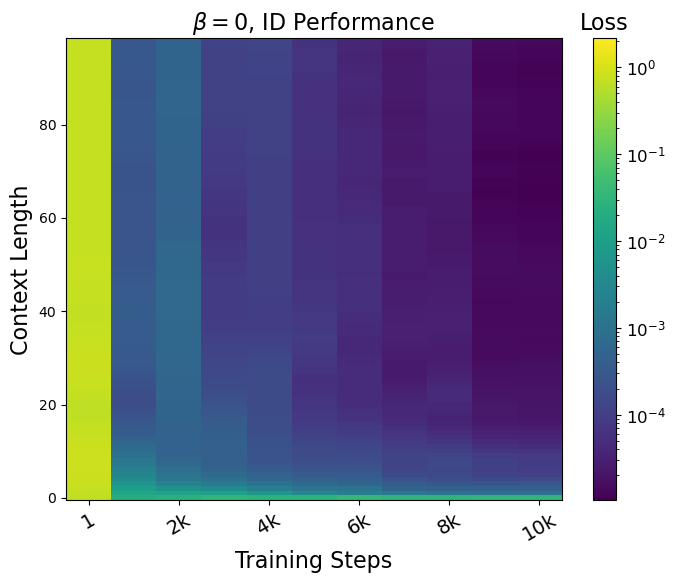

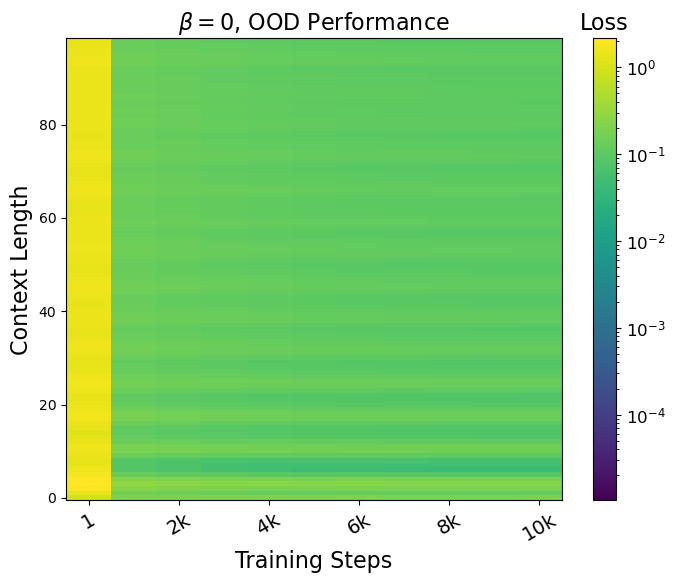

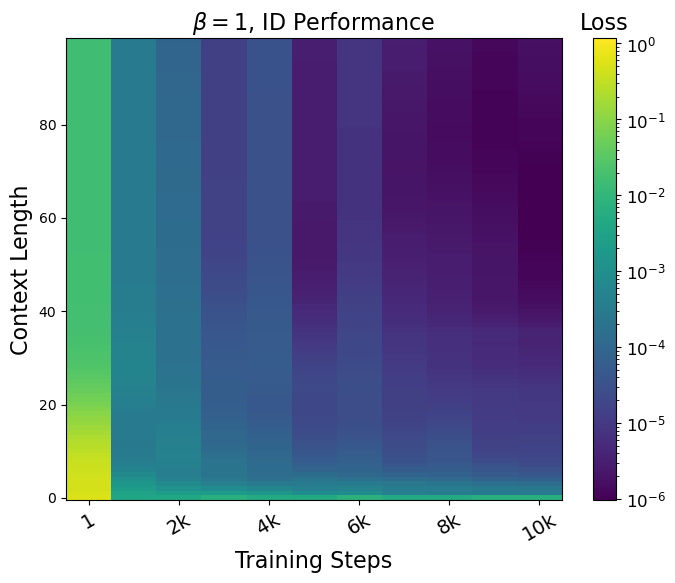

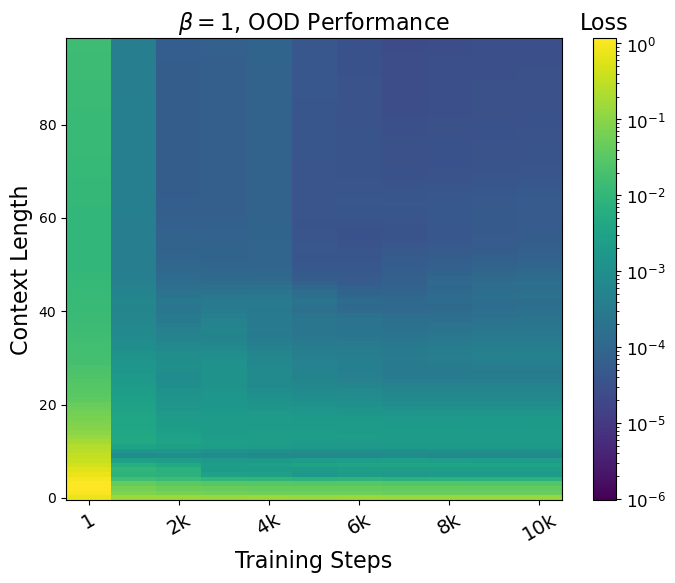

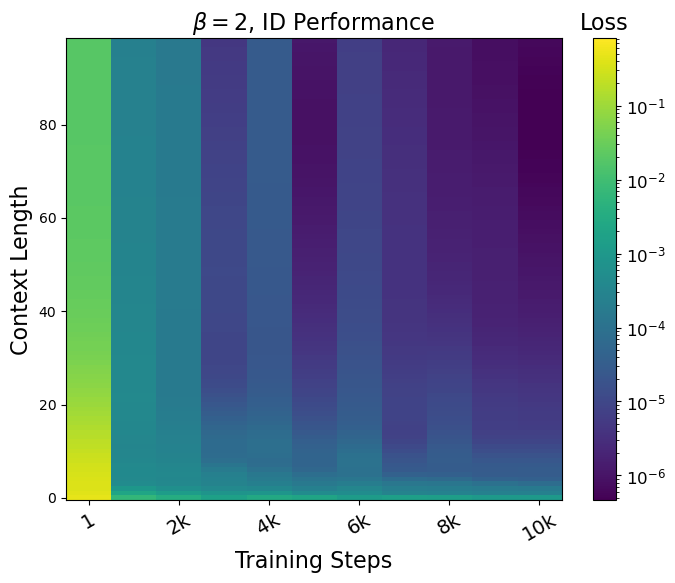

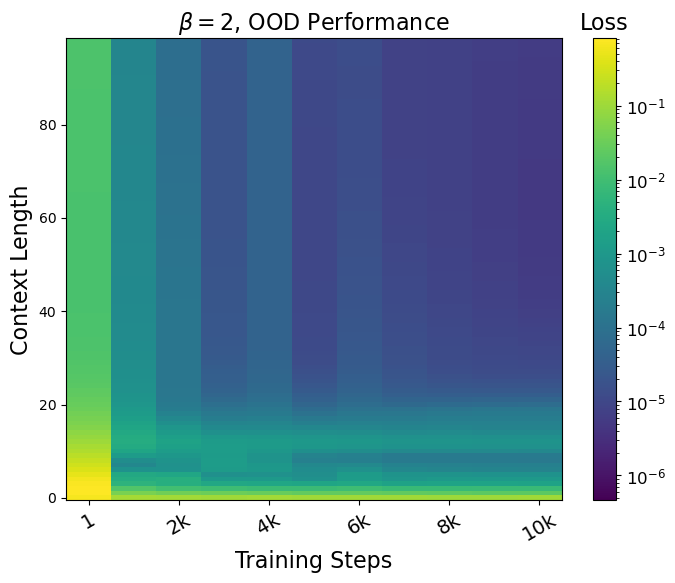

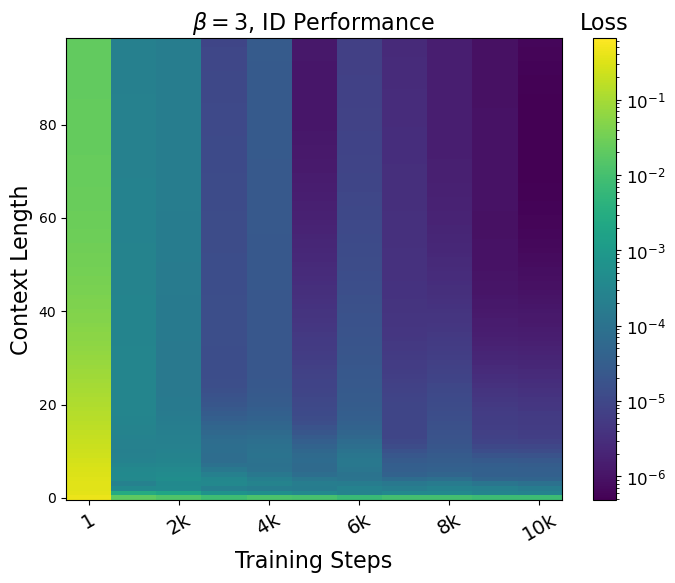

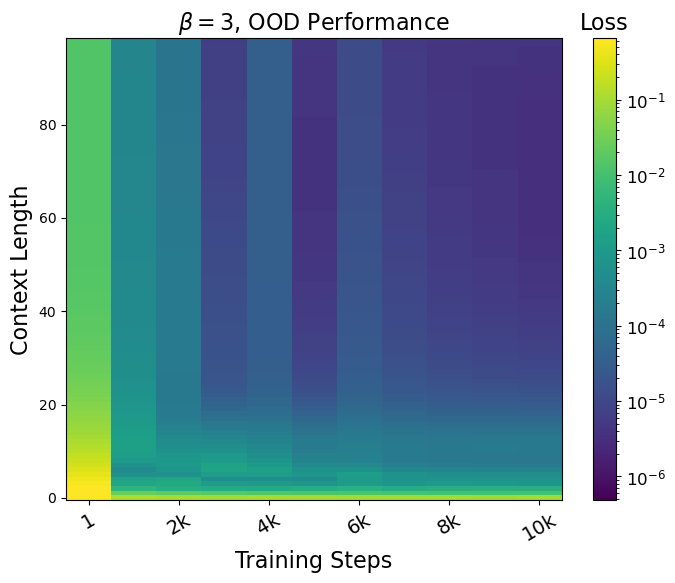

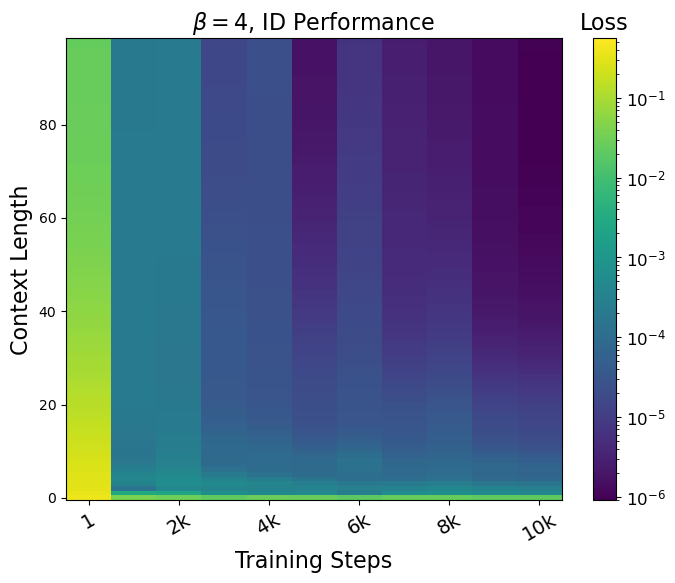

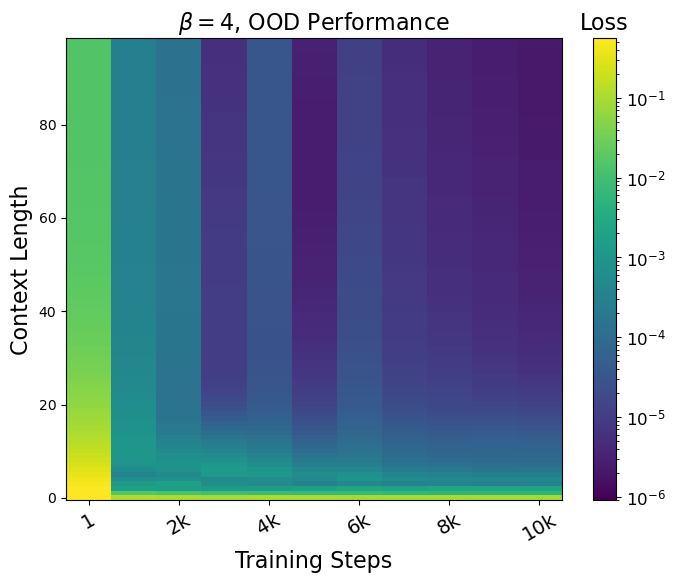

In [26]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    map_ood = np.zeros((len(n_iters),99))
    map_id = np.zeros((len(n_iters),99))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]
        for ictx in np.arange(99):
            loss = []
            for ood in ood_vals:
                im = list(masses).index(ood)
                loss.append(dsel[ictx,im,kcut,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_ood[ii,ictx] = loss

            loss = []
            for id_val in id_vals:
                im = list(masses).index(id_val)
                loss.append(dsel[ictx,im,kcut,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_id[ii,ictx] = loss

    norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_id
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_ood
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### Mass interpolation in [4,5,6]. Trained with full range of $k$

In [27]:
model = "discrete_mkb_mLoHi_kAll_betaAll_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [4,5,6]
id_vals = [1,2,3,8,9,10]
kcut = slice(2,-2)

In [146]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_mass_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [1,5]

        for i,k_test in enumerate(ks):
            plt.figure(figsize=(8,6))
            ik = list(ks).index(k_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(masses,data[n_iter][n_ctx_test-1,:,ik,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $k = {k_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Mass",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/k{k_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

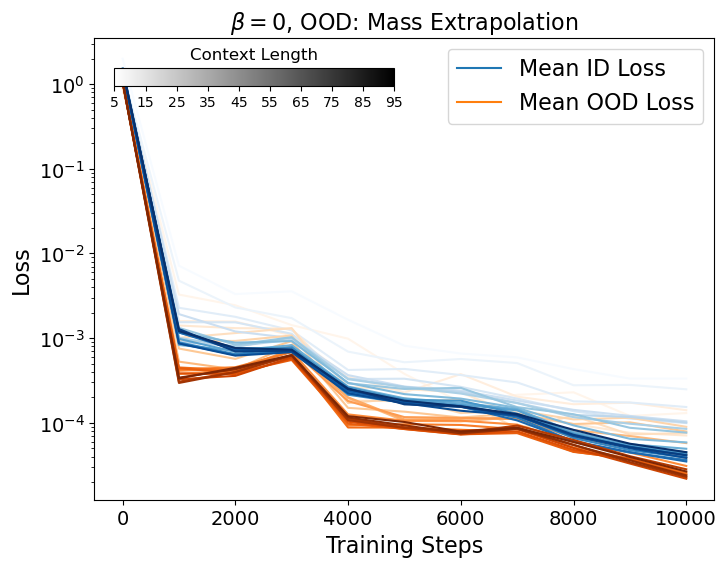

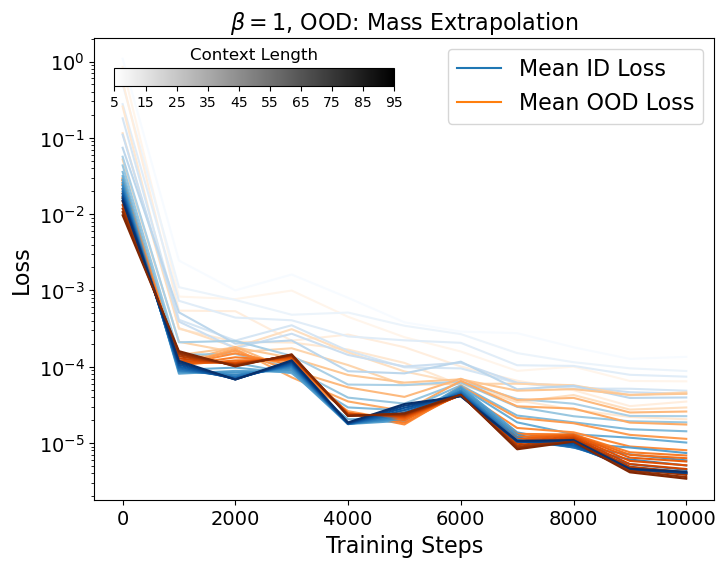

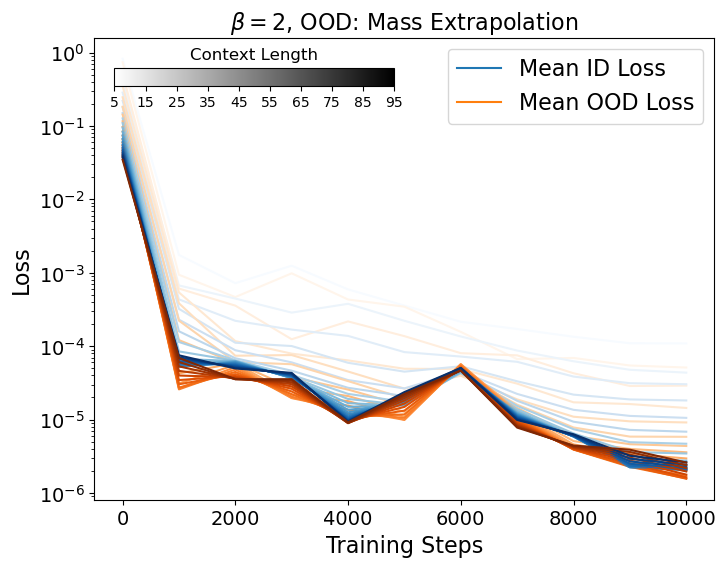

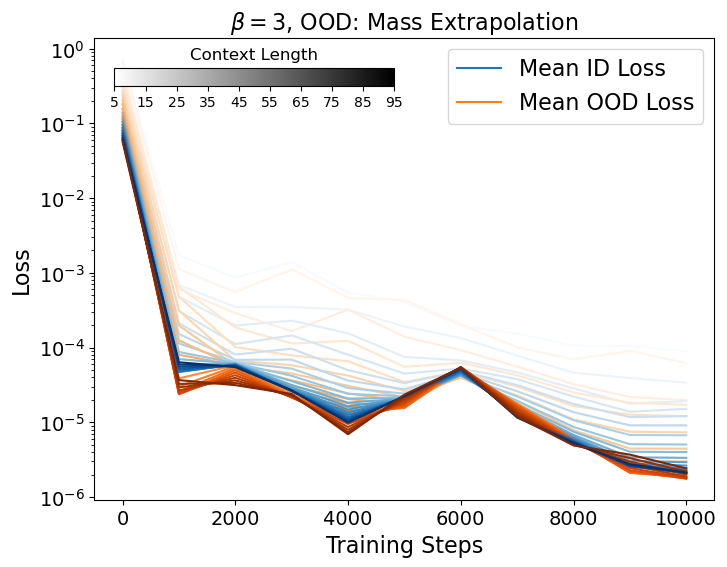

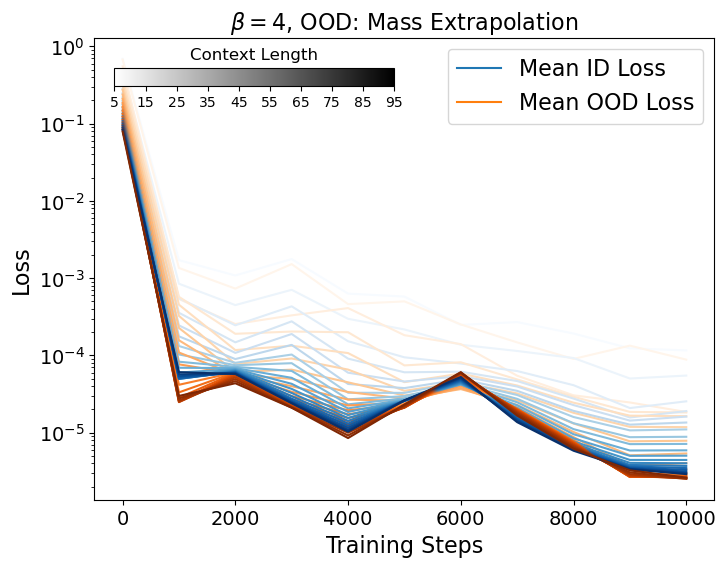

In [28]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    context_lens = np.arange(5,99,5)
    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
    colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

    fig = plt.figure(figsize=(8,6))
    for ic,n_ctx in enumerate(context_lens):
        ictx = n_ctx-1
        mean_ood_performance = []
        mean_id_performance = []
        for n_iter in n_iters:
            dsel = data[n_iter]
            total_loss = 0
            total_n = 0
            for ood in ood_vals:
                im = list(masses).index(ood)
                total_loss += dsel[ictx,im,kcut,ib].sum()
                total_n += dsel[ictx,im,kcut,ib].size
            mean_ood_performance.append(total_loss/total_n)

            total_loss = 0
            total_n = 0
            for id_val in id_vals:
                im = list(masses).index(id_val)
                total_loss += dsel[ictx,im,kcut,ib].sum()
                total_n += dsel[ictx,im,kcut,ib].size
            mean_id_performance.append(total_loss/total_n)

        plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
        plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])

    #plt.legend(loc='upper right',fontsize=16)
    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=context_lens[::2])
    cbar_ax.tick_params(labelsize=10)

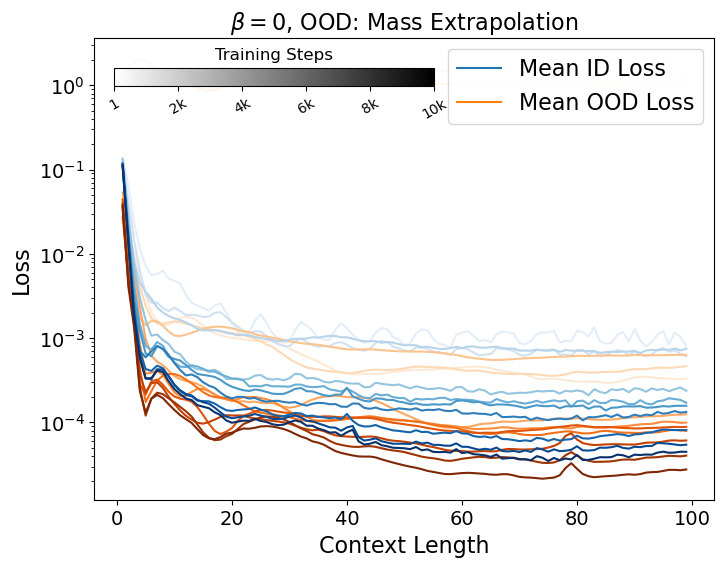

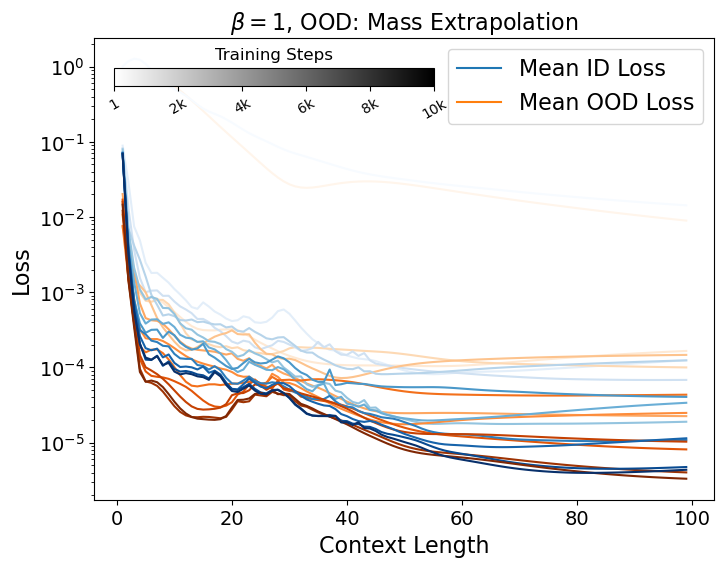

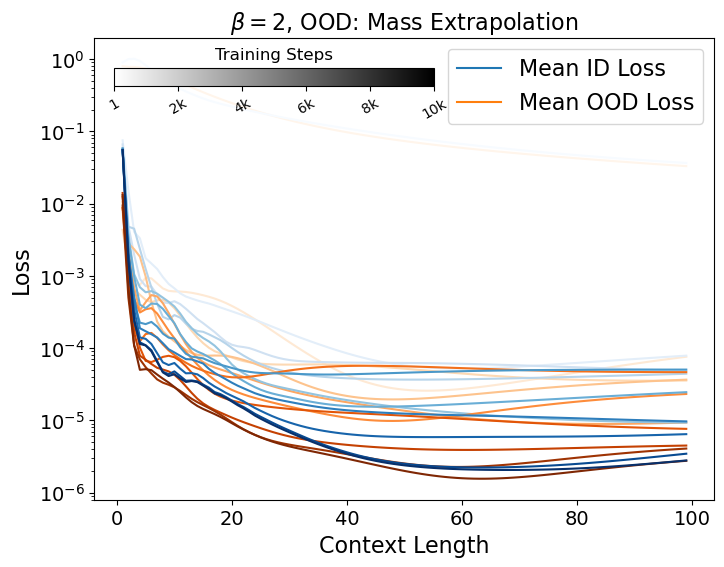

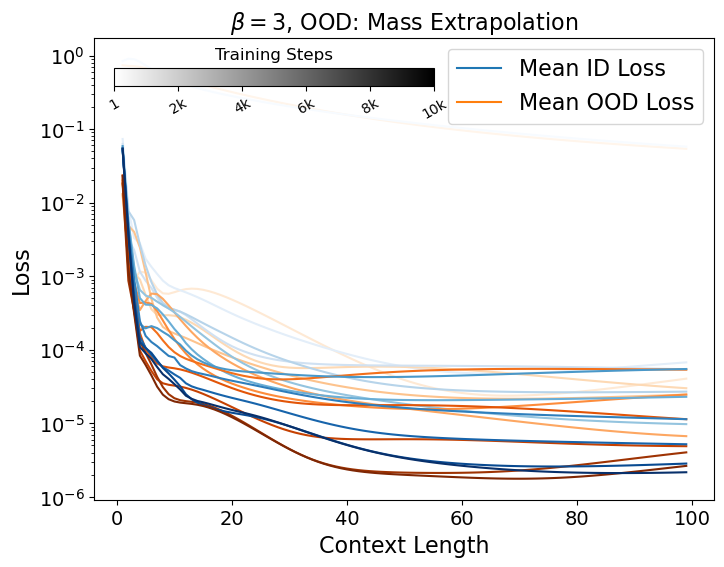

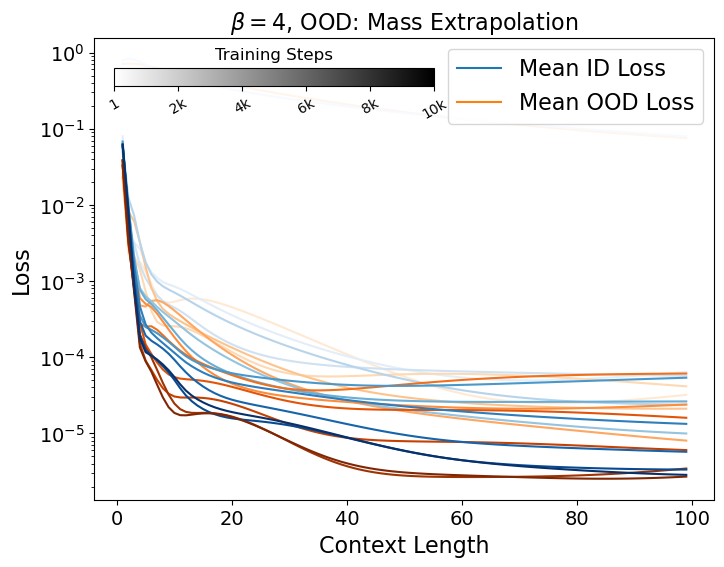

In [31]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
    colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

    fig = plt.figure(figsize=(8,6))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]

        all_losses = []
        for ood in ood_vals:
            im = list(masses).index(ood)
            all_losses.append(dsel[:,im,kcut,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])

        all_losses = []
        for id_val in id_vals:
            im = list(masses).index(id_val)
            all_losses.append(dsel[:,im,kcut,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])


    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Context Length",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: Mass Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
    cbar_ax.tick_params(labelsize=10,rotation=30)

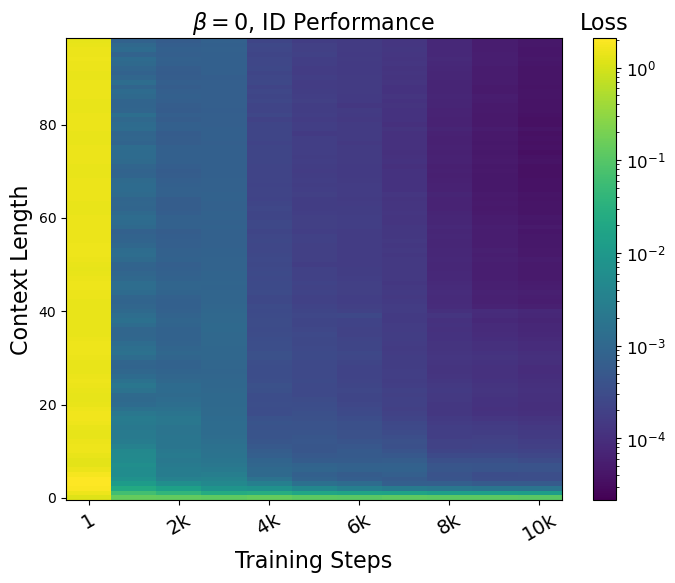

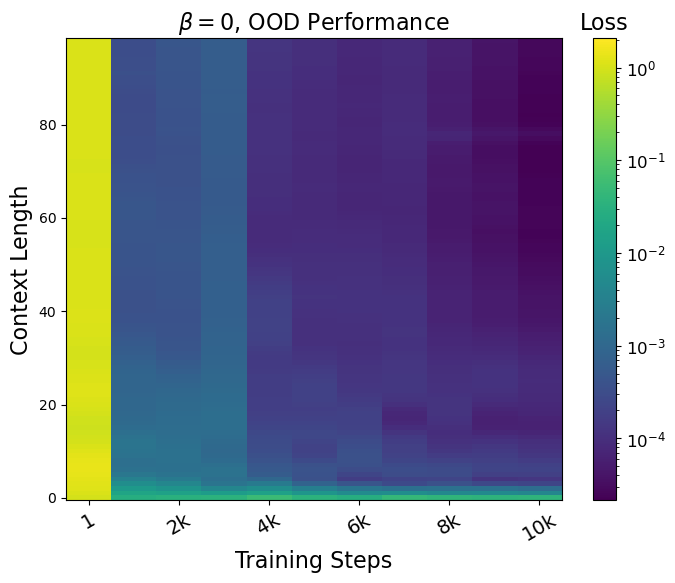

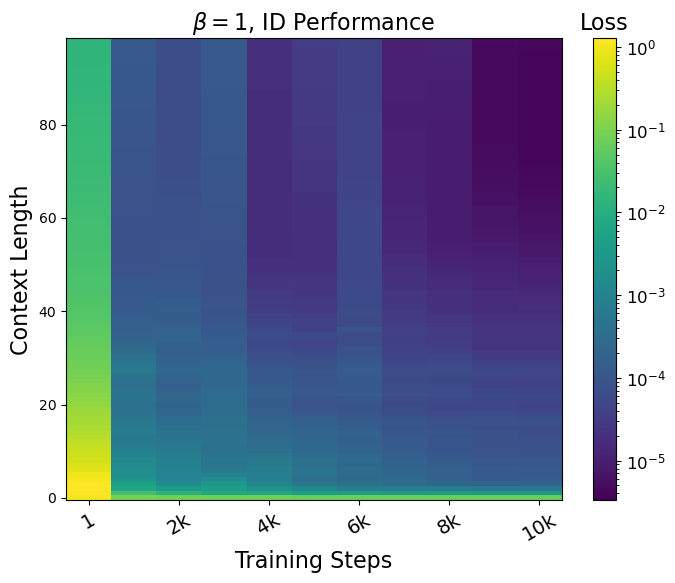

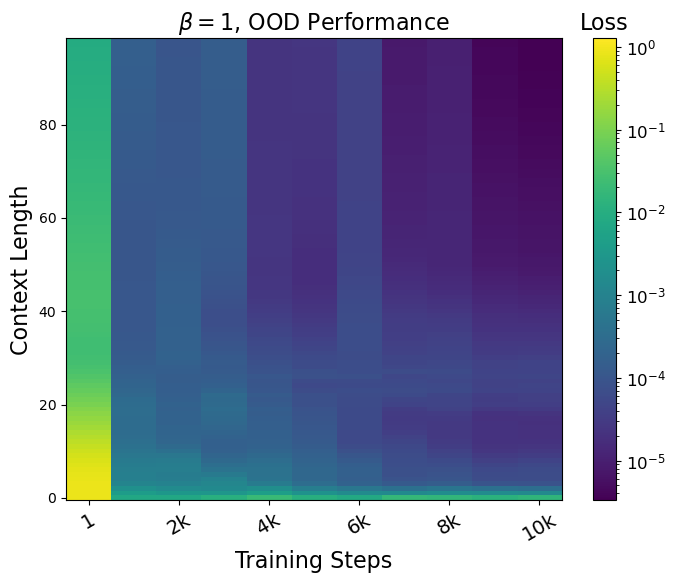

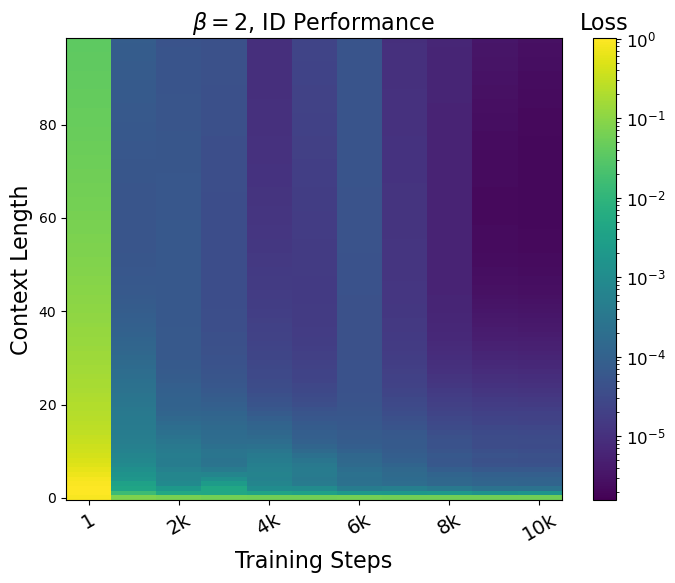

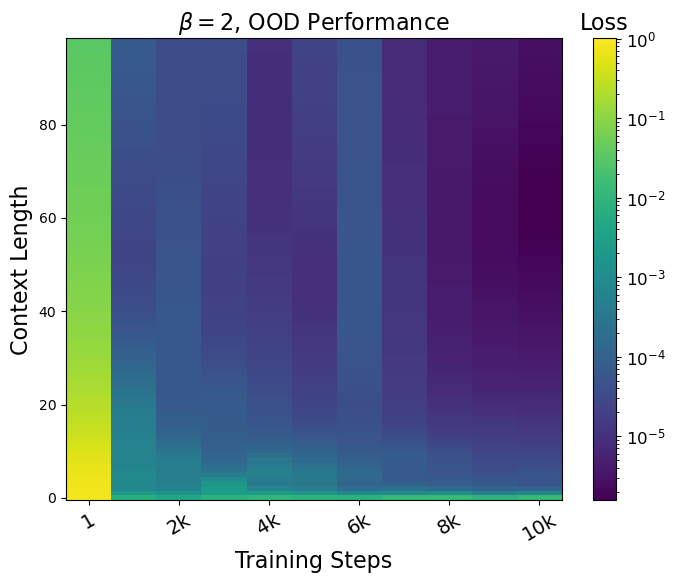

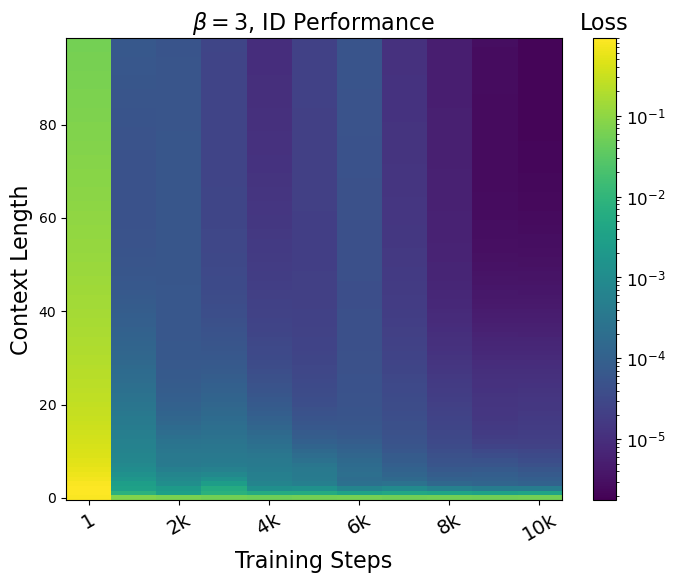

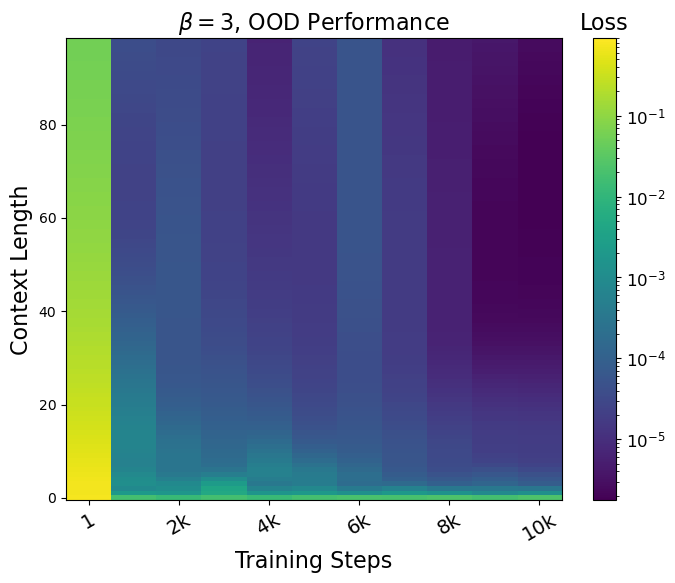

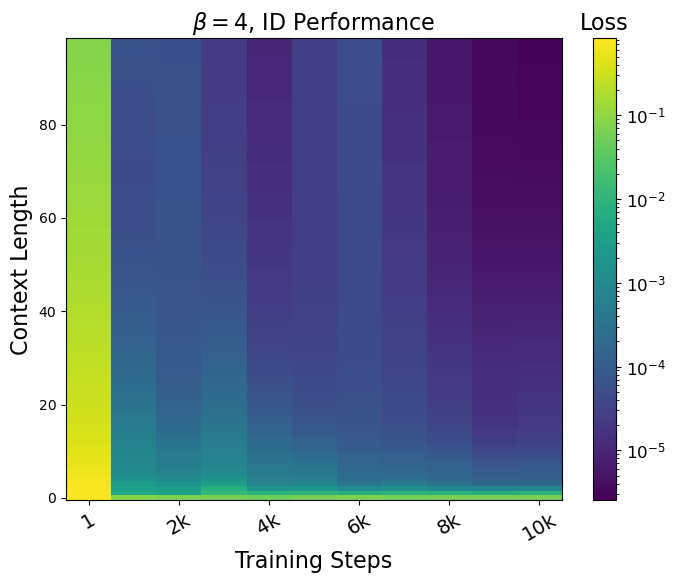

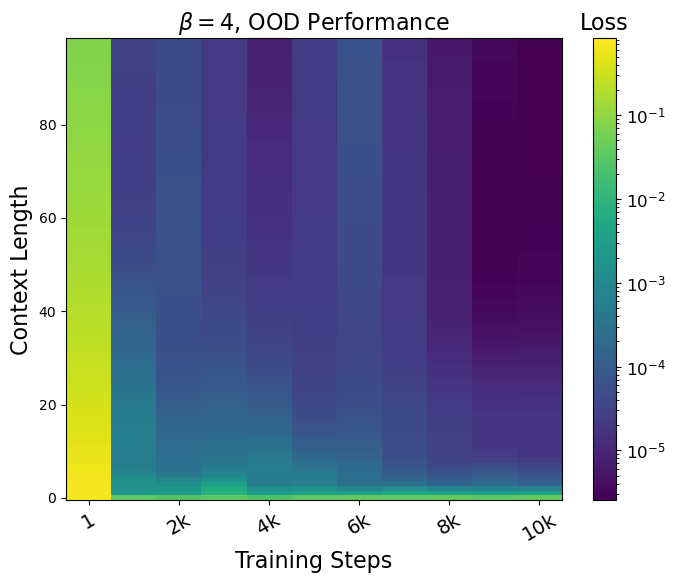

In [32]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    map_ood = np.zeros((len(n_iters),99))
    map_id = np.zeros((len(n_iters),99))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]
        for ictx in np.arange(99):
            loss = []
            for ood in ood_vals:
                im = list(masses).index(ood)
                loss.append(dsel[ictx,im,kcut,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_ood[ii,ictx] = loss

            loss = []
            for id_val in id_vals:
                im = list(masses).index(id_val)
                loss.append(dsel[ictx,im,kcut,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_id[ii,ictx] = loss

    norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_id
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_ood
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

## Generalization in $k$: extrapolation and interpolation

### Low --> High $k$ extrapolation. Trained with full range of $m$

In [33]:
model = "discrete_mkb_mAll_kLo_betaAll_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [16,17,18,19,20]
id_vals = [10,11,12,13,14,15]
mcut = slice(3,-2)

In [154]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_k_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [10,15]

        for i,m_test in enumerate(masses):
            plt.figure(figsize=(8,6))
            im = list(masses).index(m_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(ks,data[n_iter][n_ctx_test-1,im,:,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $M = {m_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Spring Constant",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/m{m_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

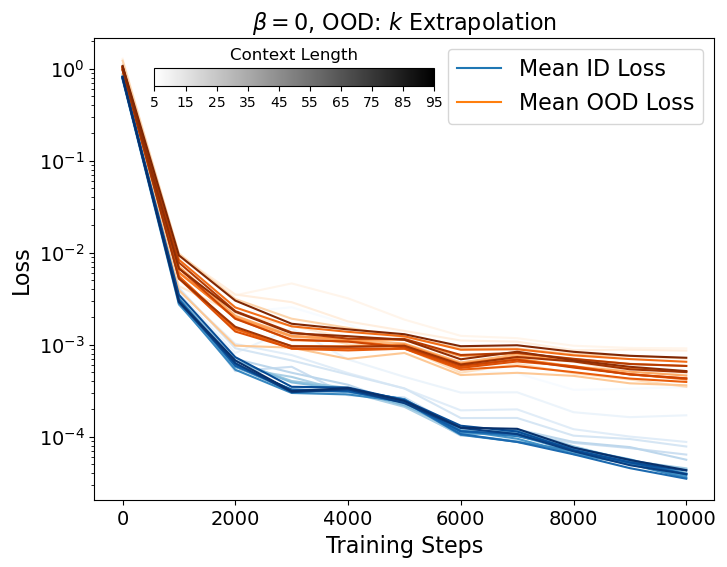

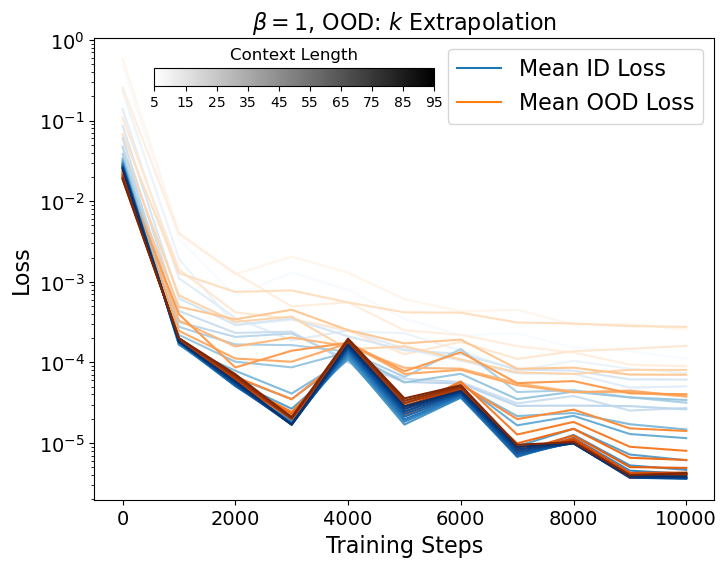

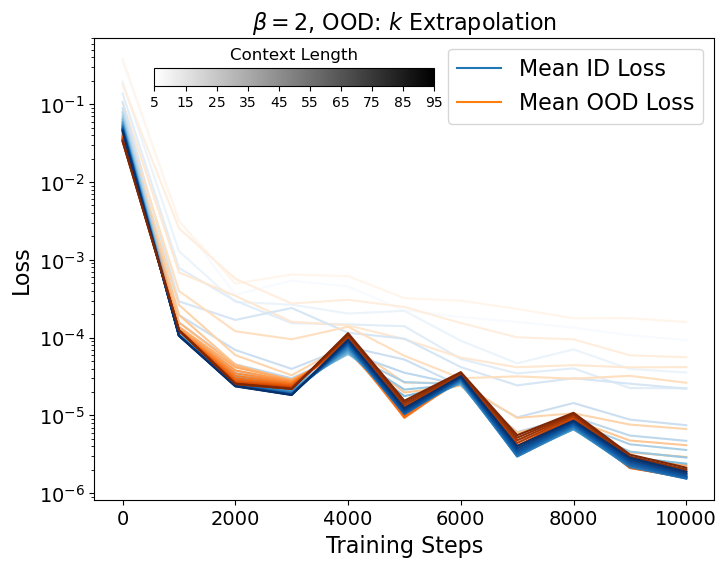

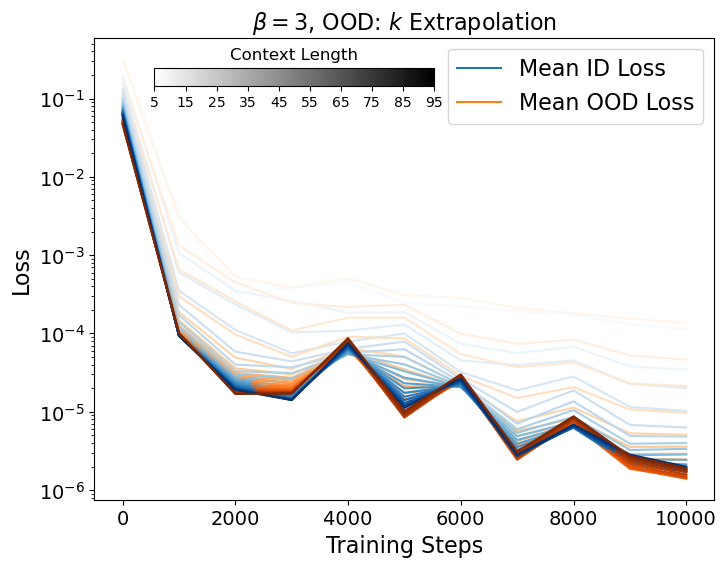

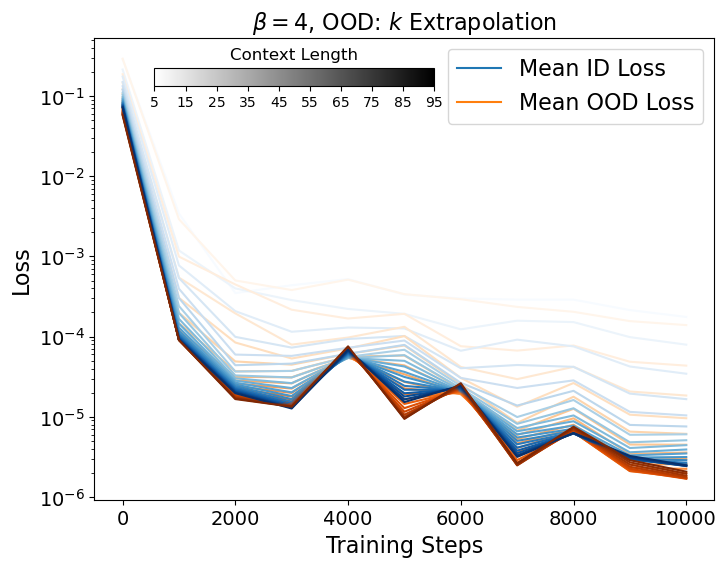

In [34]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    context_lens = np.arange(5,99,5)
    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
    colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

    fig = plt.figure(figsize=(8,6))
    for ic,n_ctx in enumerate(context_lens):
        ictx = n_ctx-1
        mean_ood_performance = []
        mean_id_performance = []
        for n_iter in n_iters:
            dsel = data[n_iter]
            total_loss = 0
            total_n = 0
            for ood in ood_vals:
                ik = list(ks).index(ood)
                total_loss += dsel[ictx,mcut,ik,ib].sum()
                total_n += dsel[ictx,mcut,ik,ib].size
            mean_ood_performance.append(total_loss/total_n)

            total_loss = 0
            total_n = 0
            for id_val in id_vals:
                ik = list(ks).index(id_val)
                total_loss += dsel[ictx,mcut,ik,ib].sum()
                total_n += dsel[ictx,mcut,ik,ib].size
            mean_id_performance.append(total_loss/total_n)

        plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
        plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])

    #plt.legend(loc='upper right',fontsize=16)
    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=context_lens[::2])
    cbar_ax.tick_params(labelsize=10)

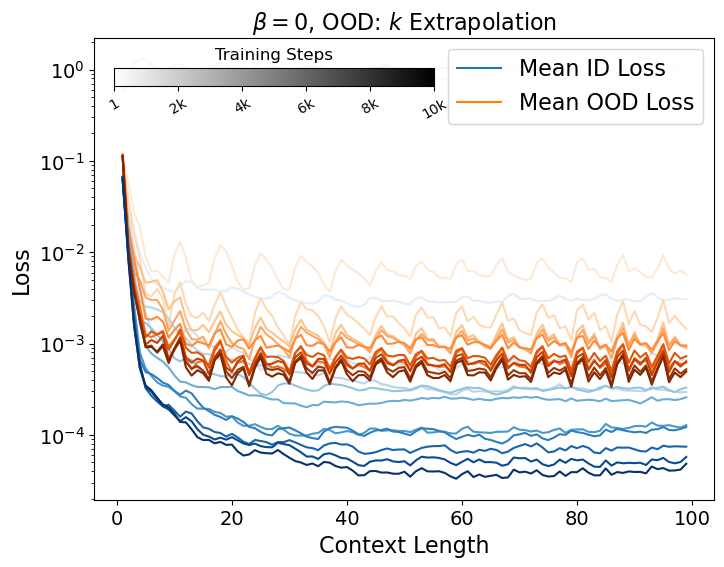

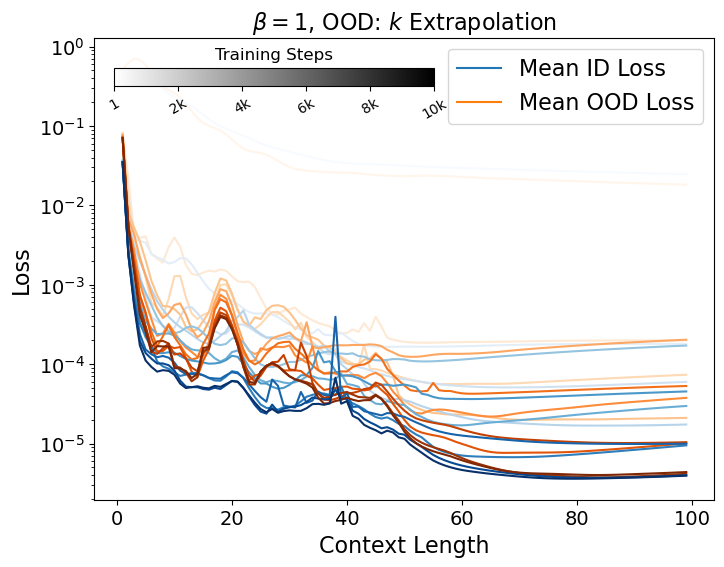

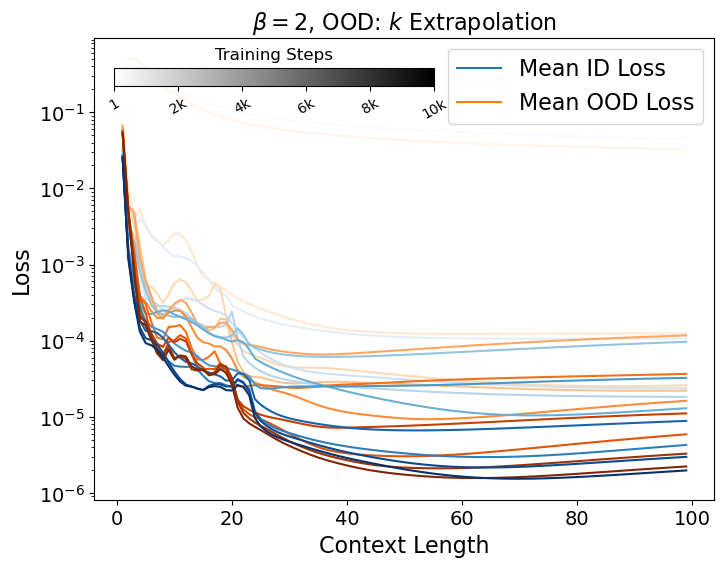

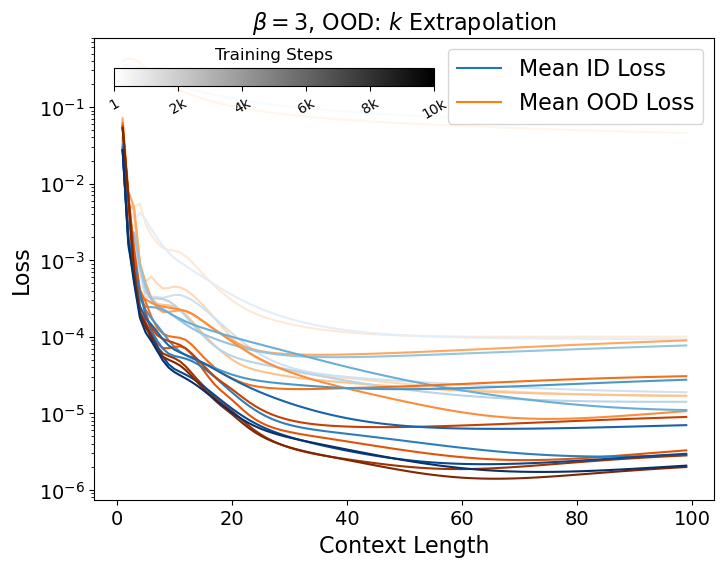

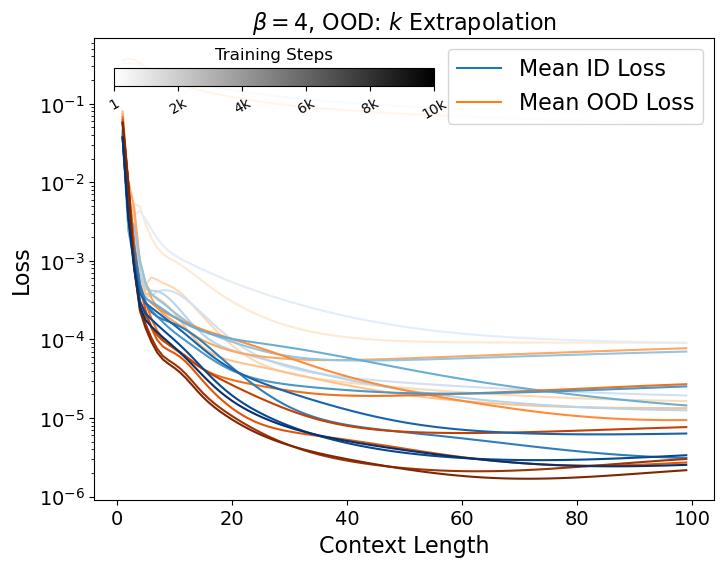

In [35]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
    colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

    fig = plt.figure(figsize=(8,6))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]

        all_losses = []
        for ood in ood_vals:
            ik = list(ks).index(ood)
            all_losses.append(dsel[:,mcut,ik,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])

        all_losses = []
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            all_losses.append(dsel[:,mcut,ik,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])


    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Context Length",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
    cbar_ax.tick_params(labelsize=10,rotation=30)

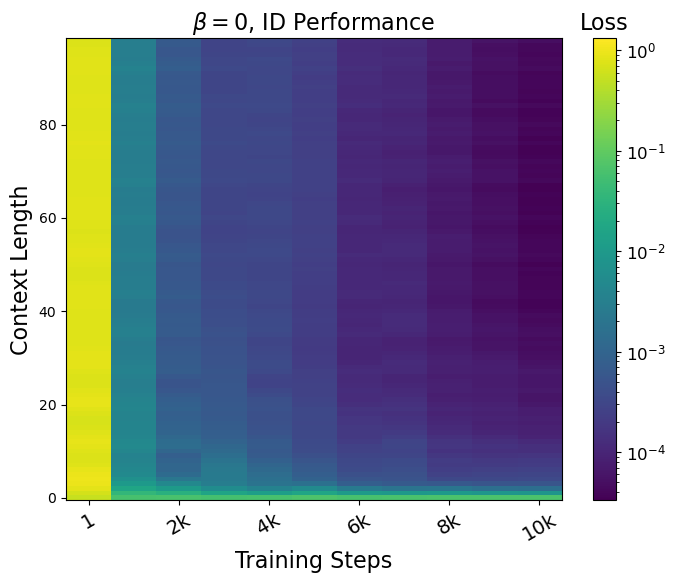

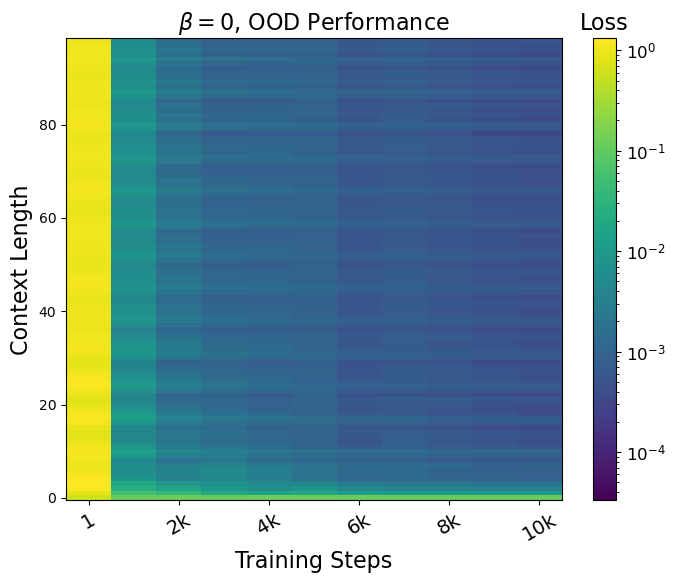

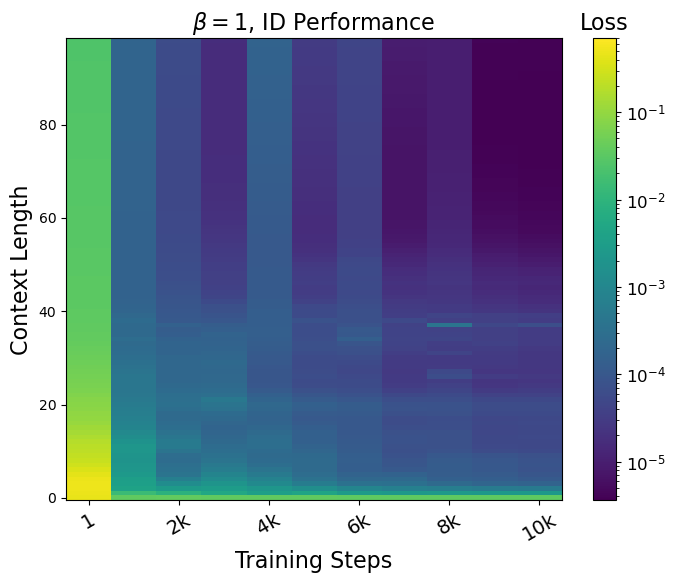

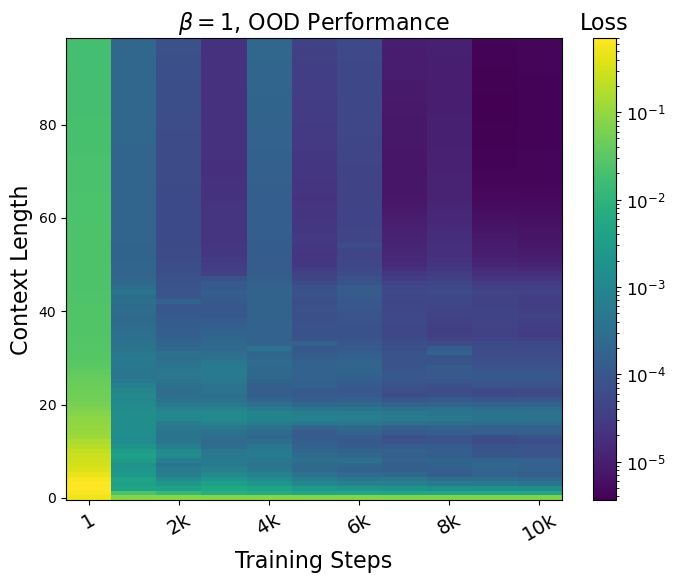

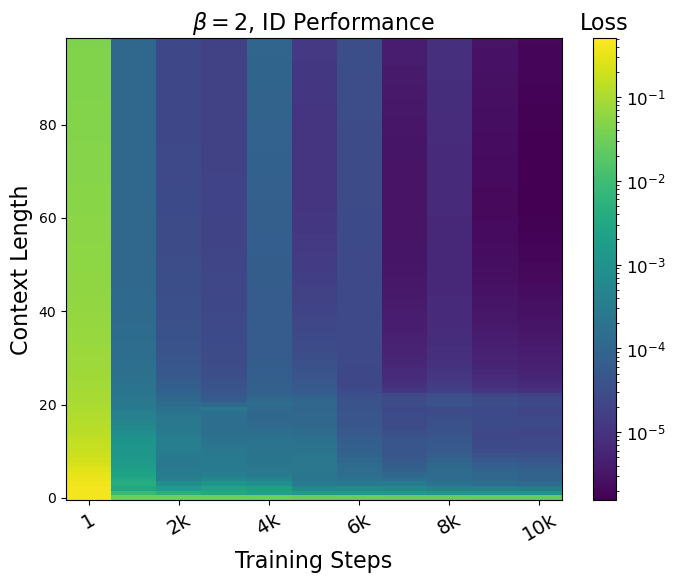

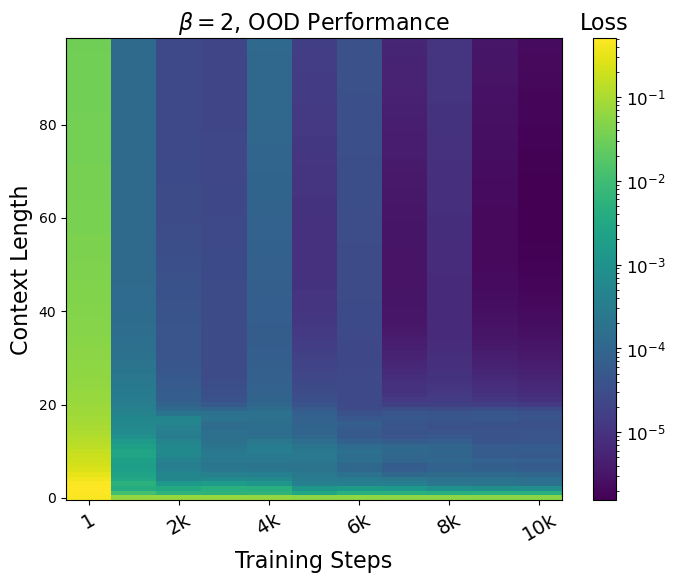

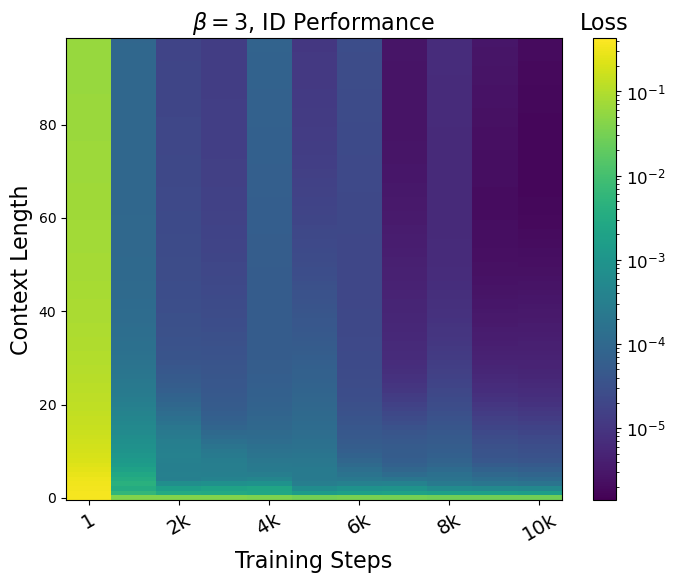

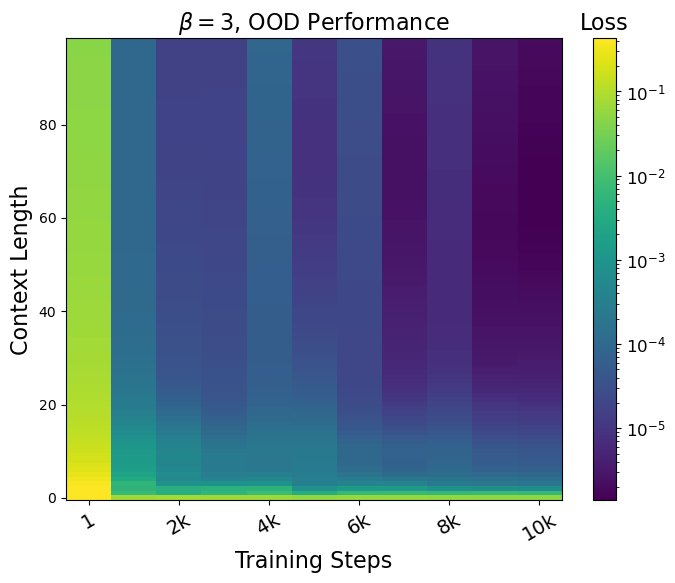

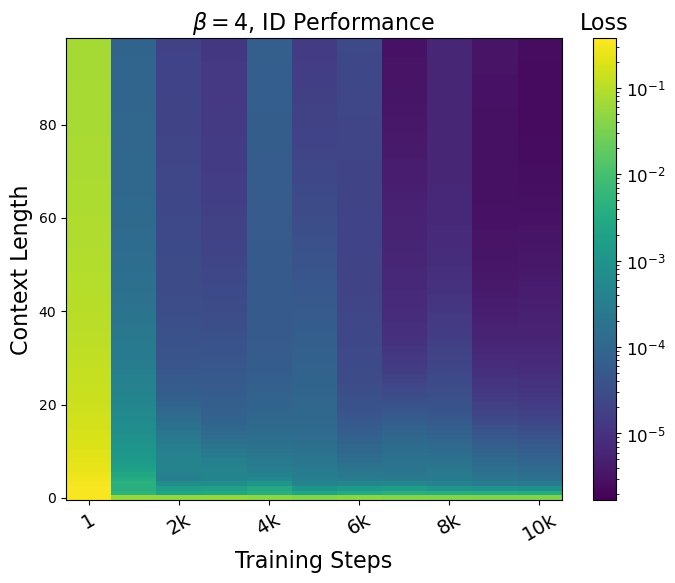

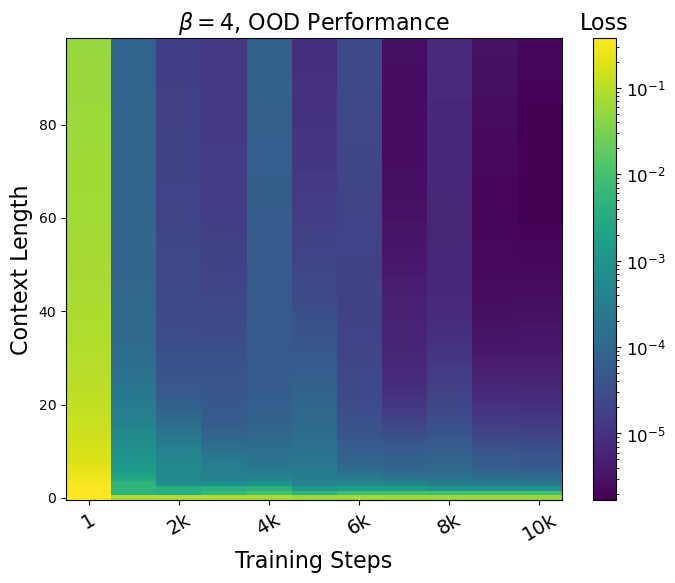

In [36]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    map_ood = np.zeros((len(n_iters),99))
    map_id = np.zeros((len(n_iters),99))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]
        for ictx in np.arange(99):
            loss = []
            for ood in ood_vals:
                ik = list(ks).index(ood)
                loss.append(dsel[ictx,mcut,ik,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_ood[ii,ictx] = loss

            loss = []
            for id_val in id_vals:
                ik = list(ks).index(id_val)
                loss.append(dsel[ictx,mcut,ik,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_id[ii,ictx] = loss

    norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_id
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_ood
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)

### High --> Low $k$ extrapolation. Trained with full range of $m$

In [37]:
model = "discrete_mkb_mAll_kHi_betaAll_noRoPE"
data, n_iters, masses, ks, betas = ptools.load_evaluations(model)
pdir = f"plots/{model}/"
os.makedirs(pdir,exist_ok=True)

ood_vals = [10,11,12,13,14,15]
id_vals = [16,17,18,19,20]
mcut = slice(3,-2)


KeyboardInterrupt



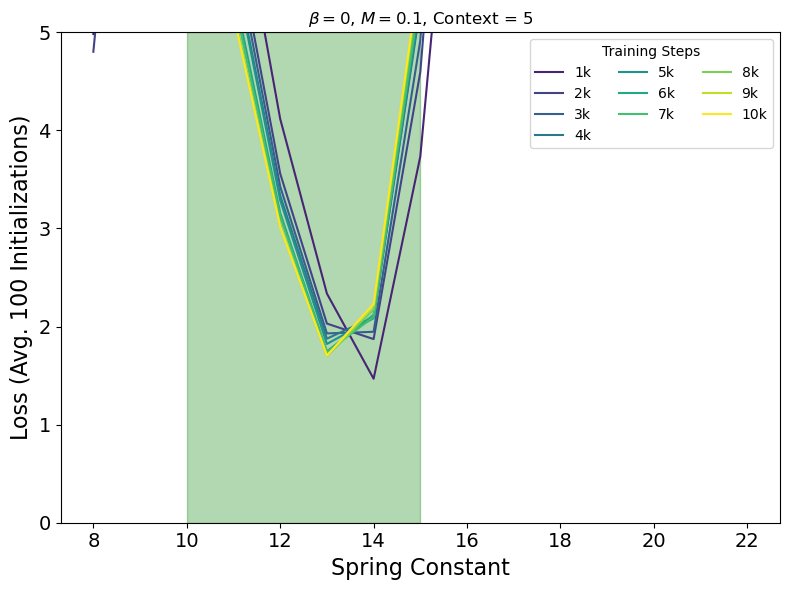

In [38]:
for beta_test in [0]:
    for n_ctx_test in np.arange(5,100,5):
        ib = list(betas).index(beta_test)
        outdir = f"{pdir}/loss_vs_k_allSteps/beta{beta_test}_ctx{n_ctx_test}/"
        os.makedirs(outdir,exist_ok=True)
        train_window = [10,15]

        for i,m_test in enumerate(masses):
            plt.figure(figsize=(8,6))
            im = list(masses).index(m_test)
            cmap = plt.get_cmap('viridis')
            colors = [cmap(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
            plt.gca().axvspan(*train_window, color='green', alpha=0.3, zorder=0)

            for ii,n_iter in enumerate(n_iters):
                if n_iter == 1:
                    continue
                plt.plot(ks,data[n_iter][n_ctx_test-1,im,:,ib],color=colors[ii],label=f"{n_iter/1000:.0f}k")
            plt.title(f"$\\beta = {beta_test}$, $M = {m_test}$, Context = {n_ctx_test}")
            plt.legend(loc='upper right',ncol=3,title="Training Steps")
            plt.ylim([0,5])
            plt.xlabel("Spring Constant",fontsize=16)
            plt.ylabel("Loss (Avg. 100 Initializations)",fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.tight_layout()
            plt.savefig(f"{outdir}/m{m_test}_beta{beta_test}_ctx{n_ctx_test}.pdf")
            plt.close()

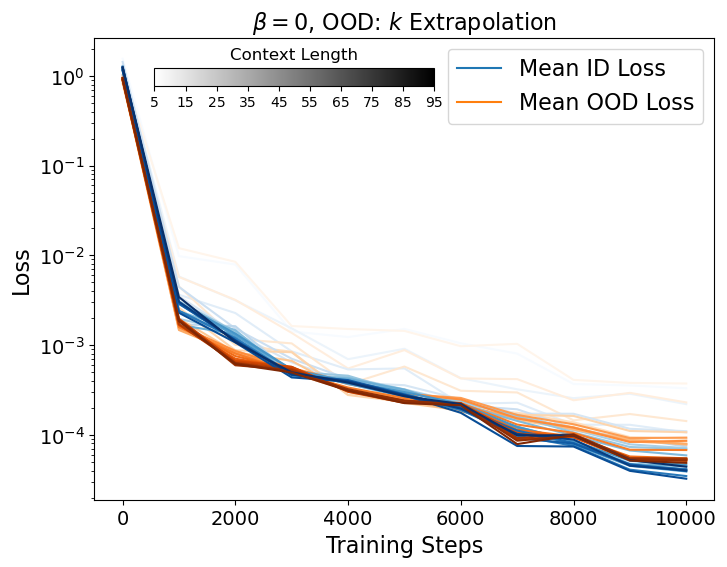

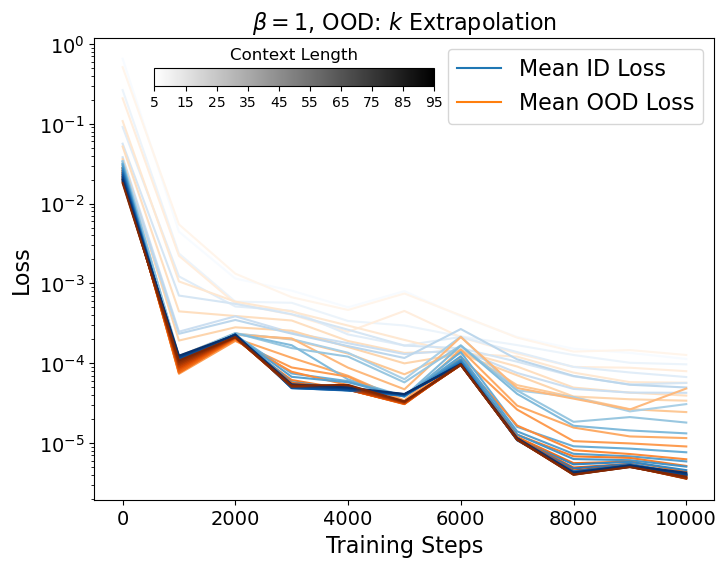

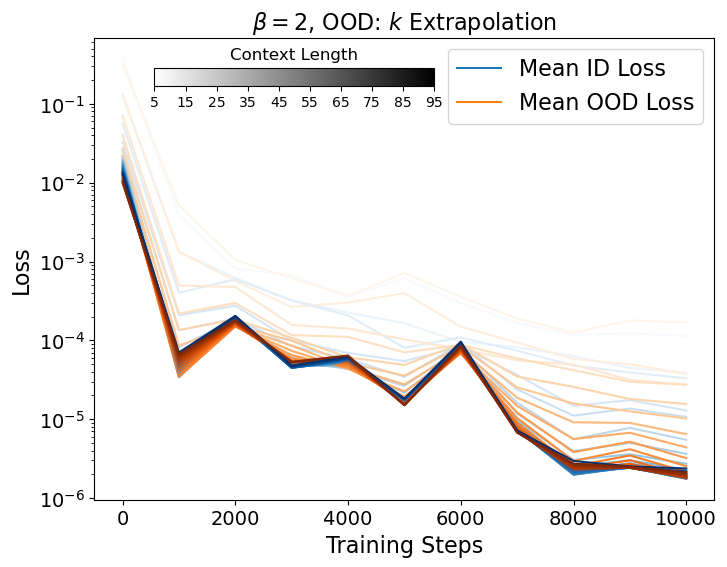

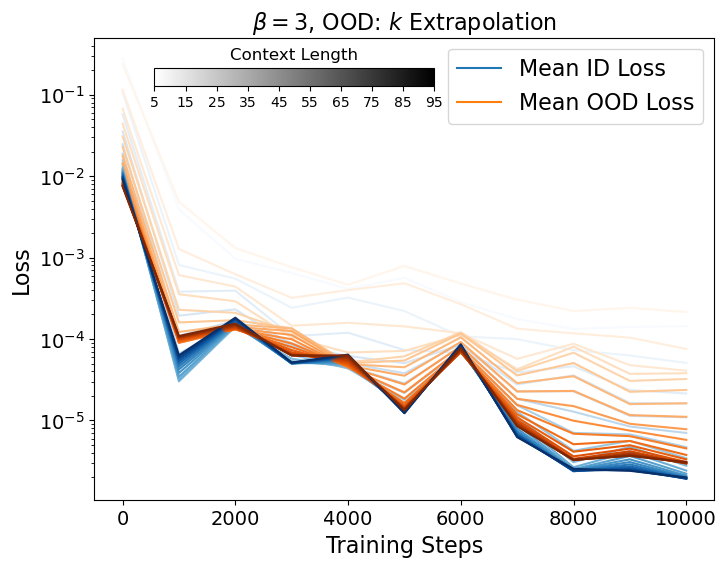

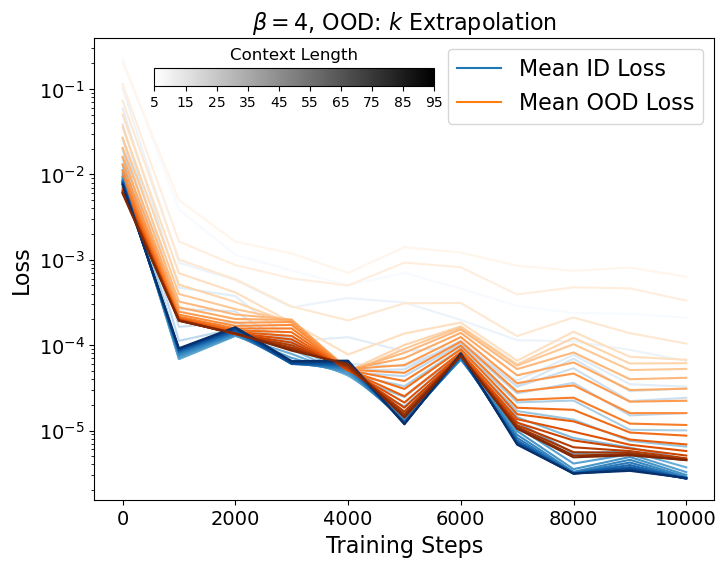

In [39]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    context_lens = np.arange(5,99,5)
    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(context_lens) - 1)) for i in range(len(context_lens))]
    colors_oranges = [cmap_oranges(i / (len(context_lens) - 1)) for i in range(len(context_lens))]

    fig = plt.figure(figsize=(8,6))
    for ic,n_ctx in enumerate(context_lens):
        ictx = n_ctx-1
        mean_ood_performance = []
        mean_id_performance = []
        for n_iter in n_iters:
            dsel = data[n_iter]
            total_loss = 0
            total_n = 0
            for ood in ood_vals:
                ik = list(ks).index(ood)
                total_loss += dsel[ictx,mcut,ik,ib].sum()
                total_n += dsel[ictx,mcut,ik,ib].size
            mean_ood_performance.append(total_loss/total_n)

            total_loss = 0
            total_n = 0
            for id_val in id_vals:
                ik = list(ks).index(id_val)
                total_loss += dsel[ictx,mcut,ik,ib].sum()
                total_n += dsel[ictx,mcut,ik,ib].size
            mean_id_performance.append(total_loss/total_n)

        plt.plot(n_iters,mean_id_performance,label="Mean ID",color=colors_blues[ic])
        plt.plot(n_iters,mean_ood_performance,label="Mean OOD",color=colors_oranges[ic])

    #plt.legend(loc='upper right',fontsize=16)
    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.2, 0.8, 0.35, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=context_lens[0], vmax=context_lens[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Context Length", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=context_lens[::2])
    cbar_ax.tick_params(labelsize=10)

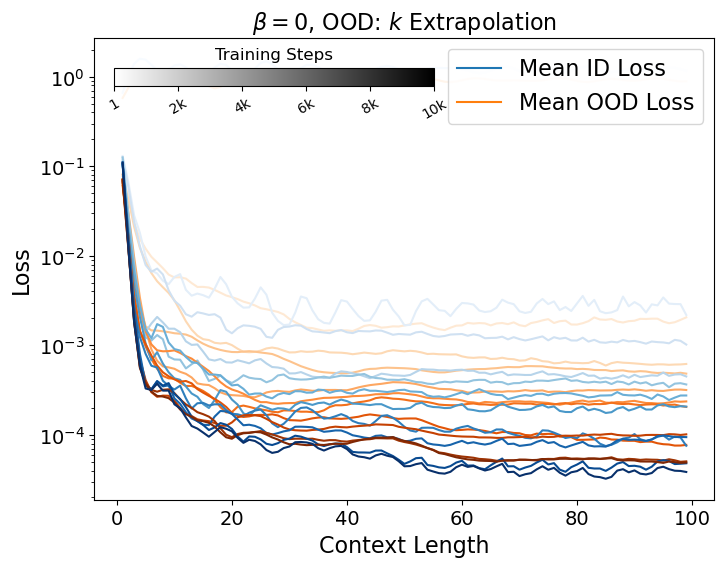

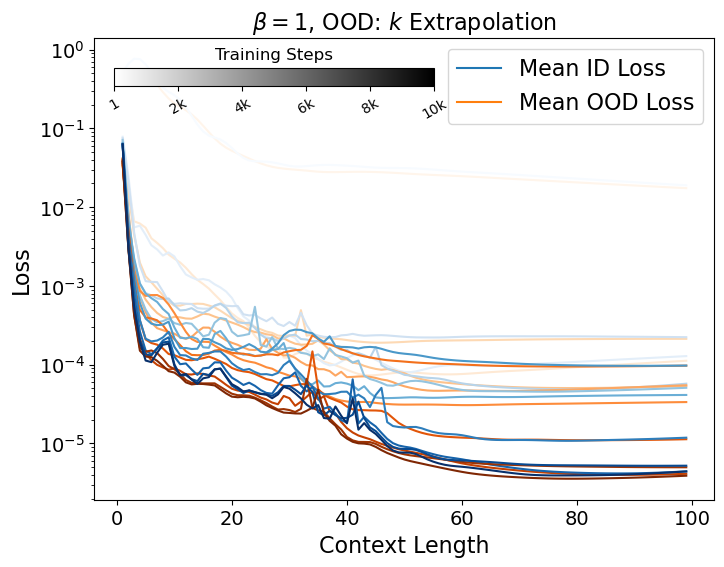

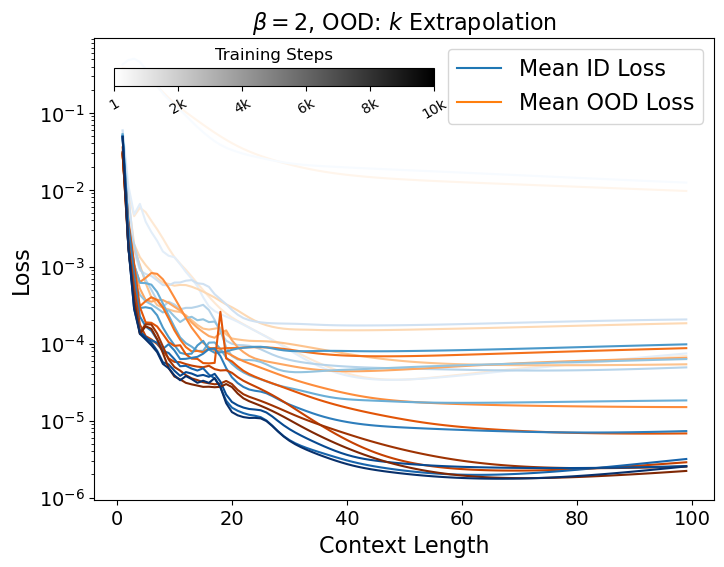

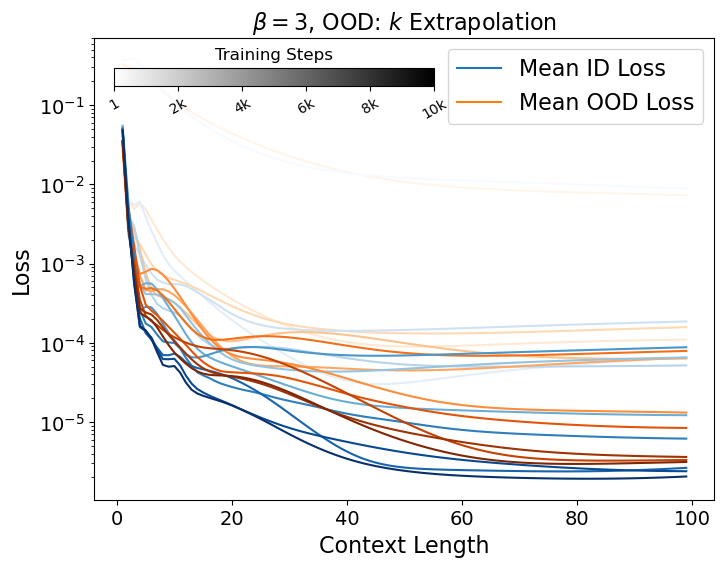

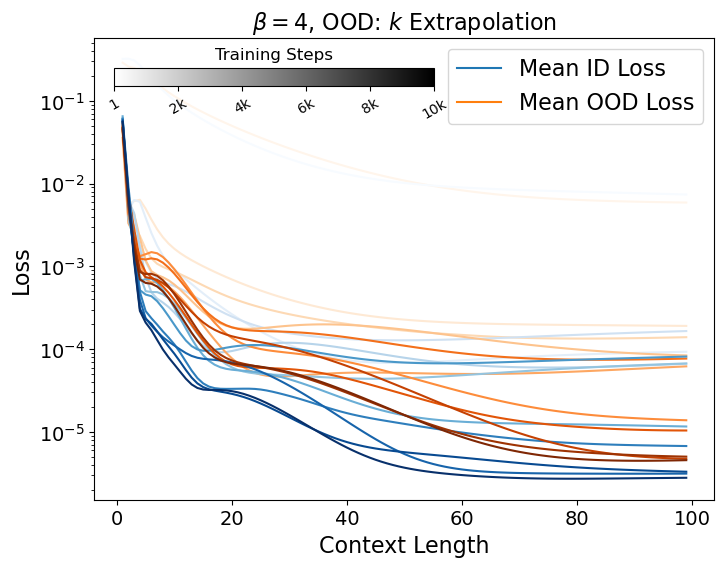

In [40]:
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    cmap_blues = plt.get_cmap('Blues')
    cmap_oranges = plt.get_cmap("Oranges")
    colors_blues = [cmap_blues(i / (len(n_iters) - 1)) for i in range(len(n_iters))]
    colors_oranges = [cmap_oranges(i / (len(n_iters) - 1)) for i in range(len(n_iters))]

    fig = plt.figure(figsize=(8,6))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]

        all_losses = []
        for ood in ood_vals:
            ik = list(ks).index(ood)
            all_losses.append(dsel[:,mcut,ik,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean OOD",color=colors_oranges[ii])

        all_losses = []
        for id_val in id_vals:
            ik = list(ks).index(id_val)
            all_losses.append(dsel[:,mcut,ik,ib])
        all_losses = np.concatenate(all_losses,axis=1).mean(axis=1)
        plt.plot(1+np.arange(all_losses.shape[0]),all_losses,label="Mean ID",color=colors_blues[ii])


    line1 = plt.plot([],[],color="C0",linestyle='-',label="Mean ID Loss")
    line2 = plt.plot([],[],color="C1",linestyle="-",label="Mean OOD Loss")
    plt.legend(handles=[*line1,*line2],loc='upper right',fontsize=16)
    plt.xlabel("Context Length",fontsize=16)
    plt.ylabel("Loss",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f"$\\beta = {beta}$, OOD: $k$ Extrapolation",fontsize=16)
    plt.yscale('log')

    # Add a custom colorbar on top
    cbar_ax = fig.add_axes([0.15, 0.8, 0.4, 0.03])  # [left, bottom, width, height]
    norm = Normalize(vmin=n_iters[0], vmax=n_iters[-1])
    cbar = ColorbarBase(cbar_ax, cmap='binary', norm=norm, orientation='horizontal')

    # Customize the colorbar
    cbar_ax.set_title("Training Steps", fontsize=12)  # Title for the colorbar
    cbar_ax.set_xticks(ticks=n_iters[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]])
    cbar_ax.tick_params(labelsize=10,rotation=30)

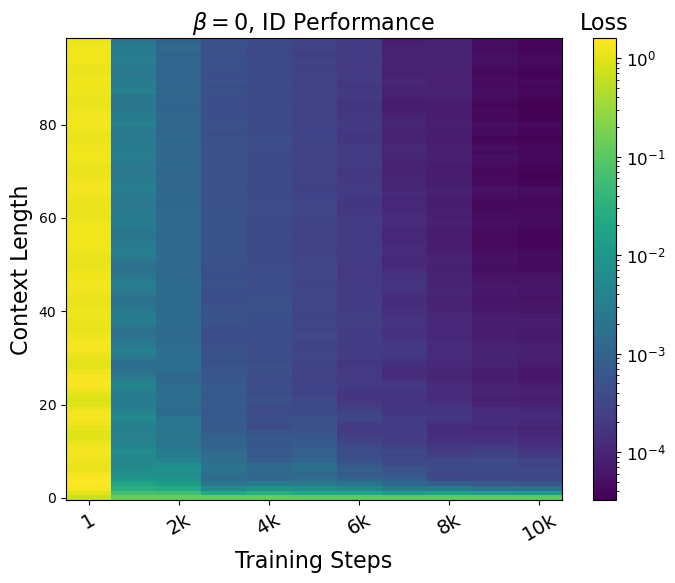

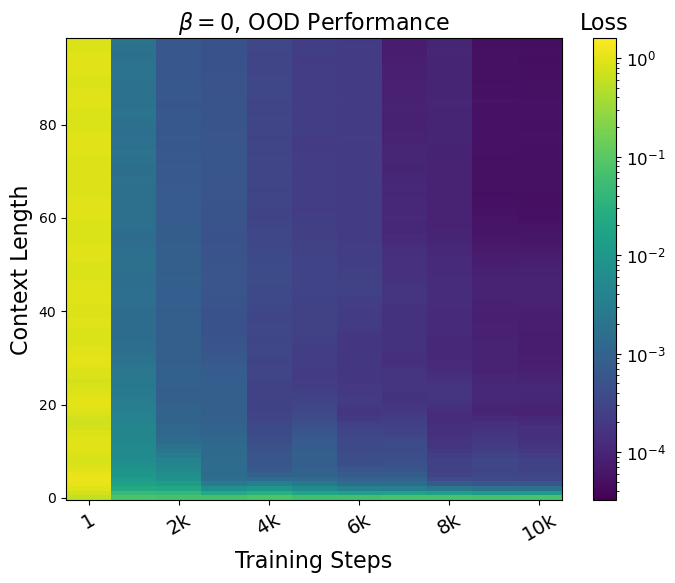

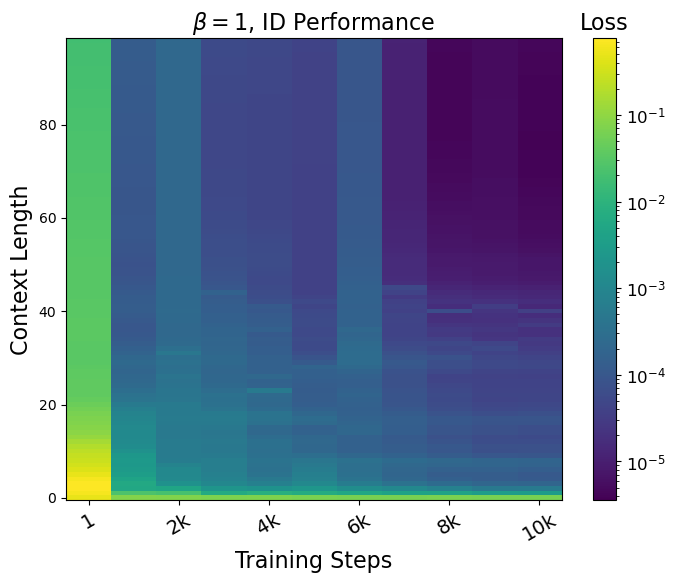

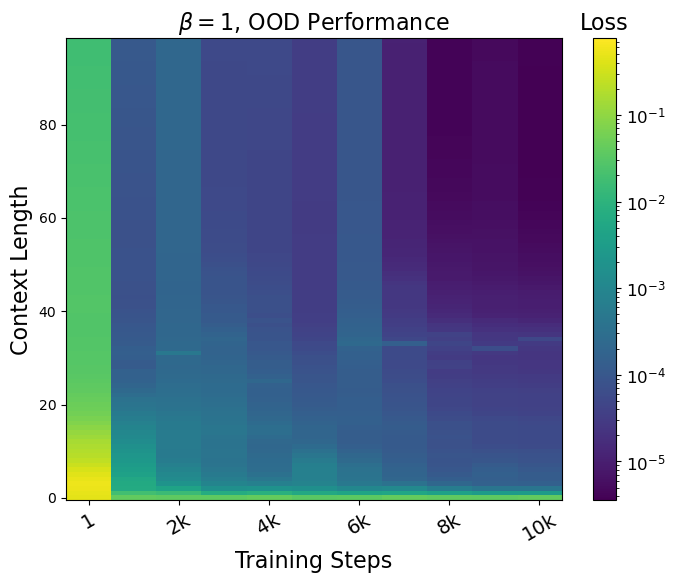

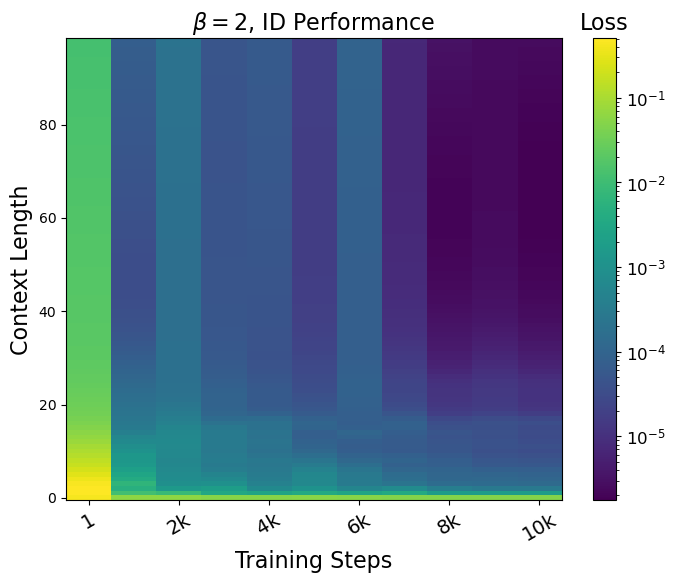

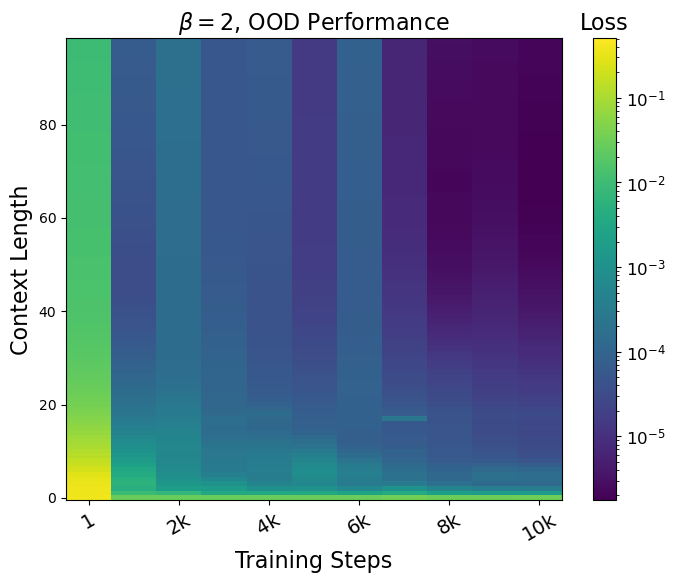

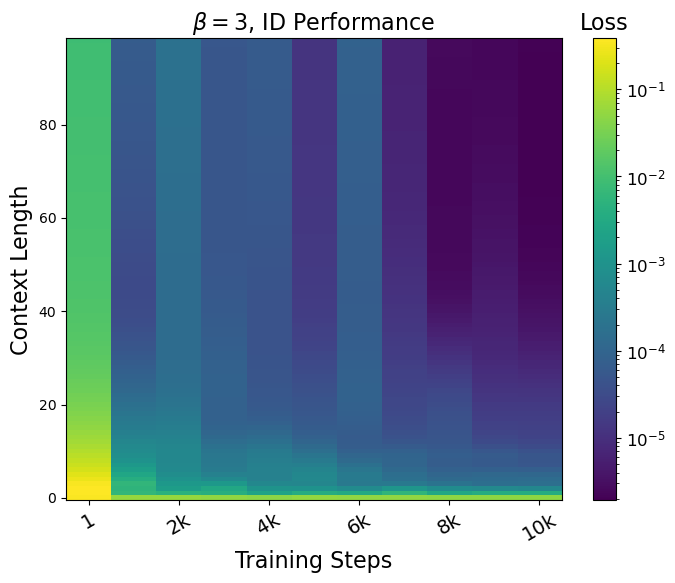

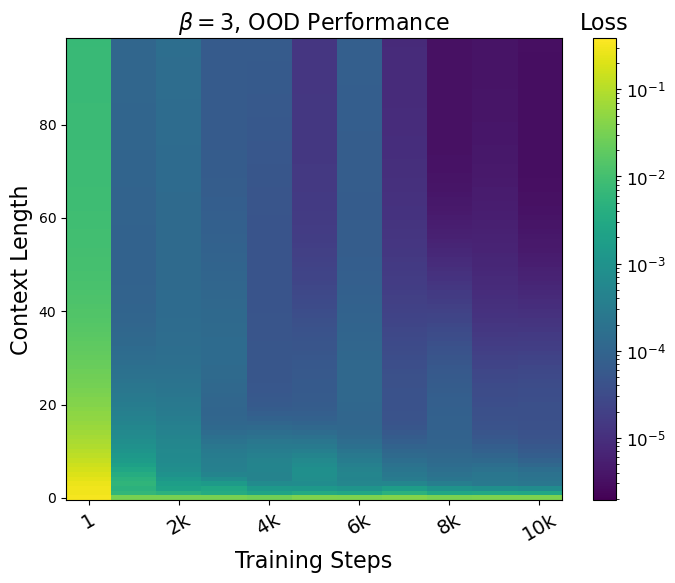

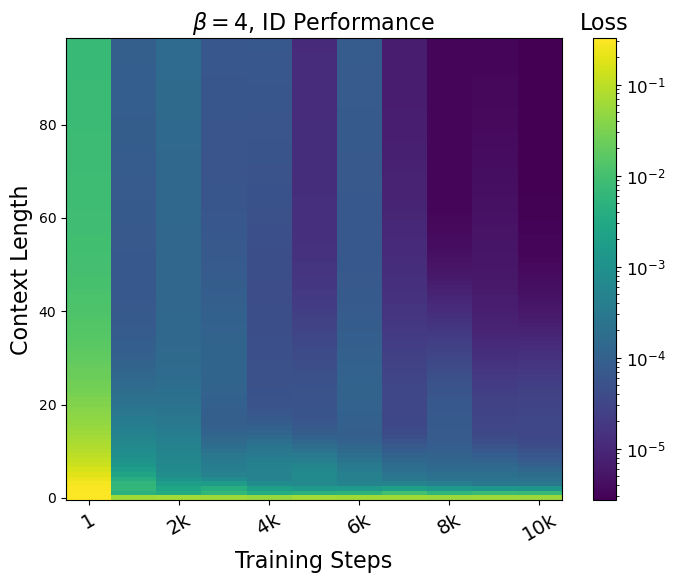

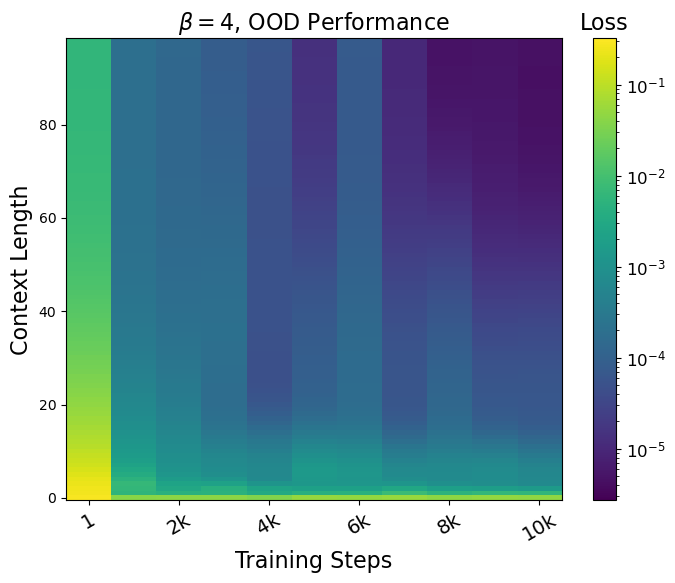

In [41]:
from matplotlib.colors import Normalize, LogNorm
from matplotlib.colorbar import ColorbarBase

for beta in [0,1,2,3,4]:
    ib = list(betas).index(beta)

    map_ood = np.zeros((len(n_iters),99))
    map_id = np.zeros((len(n_iters),99))
    for ii,n_iter in enumerate(n_iters):
        dsel = data[n_iter]
        for ictx in np.arange(99):
            loss = []
            for ood in ood_vals:
                ik = list(ks).index(ood)
                loss.append(dsel[ictx,mcut,ik,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_ood[ii,ictx] = loss

            loss = []
            for id_val in id_vals:
                ik = list(ks).index(id_val)
                loss.append(dsel[ictx,mcut,ik,ib])
            loss = np.concatenate(loss,axis=0).mean()
            map_id[ii,ictx] = loss

    norm = LogNorm(vmin=min(map_id.min(),map_ood.min()),vmax=max(map_id.max(),map_ood.max()))

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_id
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, ID Performance",fontsize=16)

    fig = plt.figure(figsize=(8,6))
    X, Y = np.meshgrid(n_iters, np.arange(99)+1)
    Z = map_ood
    heatmap = plt.imshow(Z.T, origin='lower', cmap='viridis', aspect='auto',norm=norm)
    cbar=plt.colorbar()
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Loss", fontsize=16)
    plt.xticks(ticks=np.arange(len(n_iters))[::2],labels=[f"{k}" if k < 1000 else f"{k//1000}k" for k in n_iters[::2]],
              rotation=30,fontsize=14)
    plt.xlabel("Training Steps",fontsize=16)
    plt.ylabel("Context Length",fontsize=16)
    plt.title(f"$\\beta = {beta}$, OOD Performance",fontsize=16)